# CLASE 2.4: Regresión.
---

## Introducción.
A continuación, vamos a abordar uno de los problemas más insignes del **aprendizaje supervisado**, y que ya (más o menos) presentamos en secciones anteriores, pero ahora ya con todo detalle y con el objetivo de estructurar un marco de referencia similar al que construimos para los **modelos de clasificación**: En concreto, intentaremos (de la forma más general posible) resolver el problema de ajustar una función $f$ (que ya formalizaremos en términos fondo y estructura) a un conjunto de $m$ pares de la forma $(\mathbf{x}_{1}, y_{1}),...,(\mathbf{x}_{n}, y_{n})$, donde $\mathbf{x}_{i}\in \mathbb{R}^{n}$ e $y_{i}\in \mathbb{R}$, con la importante condición de que $y_{i}$ ahora puede tomar un número virtualmente infinito de valores. Esto difiere enormemente del **problema de clasificación** tratado en la [clase 2.3](https://github.com/rquezadac/udd_data_science_lectures/blob/main/PARTE%20II%20-%20Modelos%20de%20aprendizaje%20supervisado/clase_2_3.ipynb), porque el vector $\mathbf{y}=(y_{1},...,y_{m})\in \mathbb{R}^{m}$ ya no representa un número (muy) limitado de clases o categorías, sino que ahora puede idealizarse como una *muestra* de una variable aleatoria continua (digamos $Y$), en general, desconocida. El problema así definido se conoce como **problema de regresión**.

Consideremos un conjunto de entrenamiento $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right)  :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R}^{m} \right\}$. Sea $\mathbf{x}_{i}\in \mathbb{R}^{n}$ la fila o instancia $i$-ésima de la matriz de datos de entrada $\mathbf{X}$. En el problema de regresión, estamos interesados en construir una función $f$ que permita *estimar* el valor de $y_{i}$ en función de los valores que componen $\mathbf{x}_{i}$ (para todo $i=1,...,m$), de tal forma que dicha estimación, que llamamos $\hat{y}_{i}$, pueda expresarse por medio de la ecuación 

$$\hat{y}_{i}=f(\mathbf{x}_{i});\ \forall i=1,...,m$$
<p style="text-align: right;">$(4.1)$</p>

Un modelo así definido es llamado, consecuentemente, **modelo de regresión**.

En un contexto práctico, en general, la ecuación (4.1) no describe a este problema de forma *completa*, porque es común que los datos que constituyen la matriz $\mathbf{X}$ se encuentren *alterados* o *corrompidos* por un nivel aleatorio de **ruido**. Entenderemos este último término como una modificación (de naturaleza aleatoria) no deseada propia de una muestra de datos asociados a una variable independiente, que puede ser consecuencia del proceso de captura de los datos, su almacenamiento y/o, incluso, su transmisión. De esta manera, el modelo de regresión se reescribe considerando un término de ruido $\epsilon$, tal que

$$\hat{y}_{i}=f(\mathbf{x}_{i})+ \epsilon;\ \forall i=1,...,m$$
<p style="text-align: right;">$(4.2)$</p>

Durante el resto de esta sección, salvo que se diga lo contrario, $\epsilon$ será una variable aleatoria normalmente distribuida y con media nula, que correspondientemente llamaremos **ruido Gaussiano** asociado a la observación y/o medición de nuestros datos de entrada.

Naturalmente, como en el caso de los modelos de clasificación, estamos interesados en que la función $f$ no solamente *estime* adecuadamente los valores de $\mathbf{y}$ en el conjunto de entrenamiento, sino que además *generalice* su aprendizaje sobre datos de prueba (es decir, valores de $\mathbf{y}$ que no fueron *vistos* por el correspondiente algoritmo de aprendizaje durante el entrenamiento).

La regresión es uno de los elementos fundamentales del aprendizaje automático, siendo un problema que aparece en prácticamente todas las áreas de la ciencia y la ingeniería. Áreas de gran interés en investigación donde los modelos de regresión son protagonistas corresponden al análisis de series de tiempo (fundamental en ciencias sociales), robótica y automatización (donde comienza a ser un arco integral de los algoritmos de **aprendizaje por reforzamiento**), aprendizaje profundo, entre otros.

La **elección** de la **función regresora** $f$ es una cuestión fundamental en este problema. Y para ello, existe una serie de enfoques y técnicas, al igual que en el caso de los modelos de clasificación. En una primera aproximación, vamos a tratar el **modelo de regresión lineal**, para el cual $f$ no será más que una transformación afin aplicada sobre los datos de entrada. Sin embargo, antes de apresurarnos a *juzgar* la simplicidad de este tipo de modelos, es bueno remarcar que haremos el esfuerzo de desarrollar la teoría subyacente a los modelos de regresión lineal de la forma más general que podamos, a fin de incorporar modelos más complejos sin abandonar la condición de que éstos puedan expresarse por medio de una función lineal.

## Regresión lineal.

### Descripción del problema.
Partiremos pues con el más elemental de los modelos de regresión, y también el más fundamental. En un contexto bien general, el problema inherente al modelo de regresión lineal puede expresarse como sigue: Dado un conjunto de datos $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right)  :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R} \right\}$, donde $\mathbf{x}_{i}\in \mathbb{R}^{n}$ representa una fila o instancia $i$-ésima de la matriz de datos de entrada $\mathbf{X}$, siendo $m$ el total de instancias de $\mathcal{D}$, asumiremos que la relación entre los pares $\left( \mathbf{x}_{1} ,y_{1}\right)  ,...,\left( \mathbf{x}_{m} ,y_{m}\right)$ es de tipo lineal. Es decir, buscamos un estimador del tipo

$$y_{i}=w_{0}+w_{1}x_{i1}+\cdots +w_{n}x_{in}+\varepsilon_{i} \  ;\  \forall i=1,...,m$$
<p style="text-align: right;">$(4.3)$</p>

donde $x_{ij}$ representa la $i$-ésima instancia asociada a la $j$-ésima variable independiente en la matriz $\mathbf{X}$. La ecuación (4.3) representa por tanto al **modelo de regresión lineal**, siendo $\varepsilon_{i}$ un término de ruido asociado a la $i$-ésima instancia observada de $\mathcal{D}$. La **función regresora** en este caso es, por tanto, una **transformación afín sencilla** que establece que el modelo es simplemente una combinación lineal entre los valores de entrada asociados a cada instancia y una serie de parámetros $w_{1},...,w_{n}$, llamados **coeficientes** o **pesos** del modelo, siendo $w_{0}$ el correspondiente **parámetro de sesgo** o **coeficiente de intercepción**. 

Podemos adoptar una notación matricial para condensar la fórmula (4.4) para el caso de las $m$ instancias de $\mathcal{D}$. Agrupando los coeficientes del modelo en un único vector, definido como $\mathbf{w}=(w_{0}, w_{1},...,w_{n})\in \mathbb{R}^{n+1}$ y agregando un $1$ a la izquierda de cada instancia $\mathbf{x}_{i}$, la ecuación (4.3) se reduce a

$$y_{i}=\mathbf{x}^{\top }_{i} \mathbf{w} +\varepsilon_{i} \  ;\  \forall i=1,...,m$$
<p style="text-align: right;">$(4.4)$</p>

Para el conjunto $\mathcal{D}$ completo, si agrupamos todos los términos de ruido en un vector $\mathbf{\varepsilon}=(\varepsilon_{1},...,\varepsilon_{m})\in \mathbb{R}^{m}$, llegamos a la **forma matricial** del modelo de regresión lineal,

$$\mathbf{y} =\mathbf{X}^{\ast} \mathbf{w} +\mathbf{\varepsilon } $$
<p style="text-align: right;">$(4.5)$</p>

Donde $\mathbf{X}^{\ast}$ es la matriz resultante de agregar una columna únicamente conformada por $1$s a la izquierda de $\mathbf{X}$. Es decir,

$$\underbrace{\left( \begin{matrix}y_{1}\\ y_{2}\\ \vdots \\ y_{m}\end{matrix} \right)  }_{\mathbf{y} \in \mathbb{R}^{m\times 1} } =\underbrace{\left( \begin{matrix}1&x_{11}&\cdots &x_{1n}\\ 1&x_{21}&\cdots &x_{2n}\\ \vdots &\vdots &\ddots &\vdots \\ 1&x_{m1}&\cdots &x_{mn}\end{matrix} \right)  }_{\mathbf{X}^{\ast } \in \mathbb{R}^{m\times n+1} } \underbrace{\left( w_{0},w_{1},...,w_{n}\right)  }_{\mathbf{w} \in \mathbb{R}^{n+1} } +\underbrace{\left( \begin{matrix}\varepsilon_{1} \\ \varepsilon_{2} \\ \vdots \\ \varepsilon_{m} \end{matrix} \right)  }_{\mathbf{\varepsilon } \in \mathbb{R}^{m\times 1} } $$
<p style="text-align: right;">$(4.6)$</p>

El modelo de regresión lineal contempla, para su correcta implementación, una serie de supuestos relativos a las $n$ variables independientes que constituyen la matriz $\mathbf{X}$, la variable de respuesta $\mathbf{y}$ y las relaciones entre ellas. Debido a la longevidad de este modelo, se han publicado un sinnúmero de investigaciones que han permitido relajar algunos de estos supuestos (o, como mínimo, expresar una versión *débil* de los mismos), aunque muchas veces tales consideraciones implicarán el aumento en la complejidad de cada implementación, o bien, mayores exigencias en términos de los datos (por ejemplo, una cantidad mínima significativa de observaciones), a fin de poder garantizar soluciones de mayor precisión.

Algunos de los supuestos más generales para el modelo de regresión lineal, en su forma más clásica, son:

- **Exogeneidad débil:** Este supuesto hace referencia esencialmente al hecho de que cada una de las variables independientes $\mathbf{x}_{1},...,\mathbf{x}_{n}\in \mathbb{R}^{m}$ que comprenden la matriz de datos de entrada $\mathbf{X}$ puede ser tratada como un conjunto fijo de datos, y no como la realización de alguna variable aleatoria determinada. En la práctica, ésto significa que las variables que constituyen el conjunto de datos no se encuentran *contaminados* por errores de muestreo. Indudablemente, se trata de un supuesto difícil de cumplir en la realidad, porque esto implica que no existe ruido en el muestreo de ninguna de las variables independientes de interés.
- **Linealidad:** Asumimos que la variable de respuesta $\mathbf{y}$ es, en efecto, una combinación lineal de las variables de entrada con respecto a una serie de ponderadores o parámetros desconocidos, que se corresponden con los **coeficientes de regresión**. Observemos que este supuesto no es demasiado restrictivo, ya que al tratar a cada variable independiente como un conjunto de datos fijo (supuesto de exogeneidad débil), la linealidad únicamente constituye una restricción sobre los parámetros de la regresión. De esta manera, las variables independientes pueden ser transformadas arbitrariamente e, inclusive, podemos añadir múltiples copias o *redundancias* de la misma variable independiente al modelo, cada una de ellas transformada de manera diferente. Un ejemplo de lo anterior es el **modelo de regresión polinomial**, donde simplemente se aplica un procedimiento de regresión lineal sobre un polinomio de grado fijo (siendo éste un hiperparámetro). Naturalmente, esta flexibilidad tiene un costo: Un modelo polinomial de grado *demasiado alto* puede ser susceptible de memorizar incluso patrones que no son de nuestro interés en un conjunto de datos (por ejemplo, ruido aleatorio, errores de medición, etc.), lo que los hace particulamente sensibiles a problemas de *overfitting*. Por esta razón, es recomendable la incorporación de **términos de regularización** que permitan controlar este problema, tales como los vistos (aunque someramente) en la [clasd 1.3](https://github.com/rquezadac/udd_data_science_lectures/blob/main/PARTE%20II%20-%20Modelos%20de%20aprendizaje%20supervisado/clase_2_3.ipynb). Profundizaremos en esto último en esta misma sección.
- **Homocedasticidad**: Asumimos que la **varianza** de los errores (que comete el modelo) no depende de los valores que hemos estimados para los coeficientes o parámetros de la regresión. De esta manera, la variabilidad de la variable de respuesta $\mathbf{y}$ es siempre la misma para un set de valores dados de estos parámetros, independiente de qué tan grandes (o pequeños) sean los valores de $\mathbf{y}$. En general, éste no es el caso, porque una variable cuya media sea muy grande tendrá típicamente una varianza mayor que otra variable cuya media sea mucho más pequeña. Por ejemplo, si predecimos (o *estimamos*) que una línea de molienda convencional tendrá un tratamiento de $70.000$ tpd, es muy probable que el valor real de dicho tratamiento oscile entre $50.000$ y $90.000$ tpd; es decir, es razonable suponer una desviación estándar de, aproximadamente, $20.000$ tpd. Sin embargo, para una planta mucho más pequeña (por ejemplo, en mediana minería), con un tratamiento de $10.000$ tpd, es más bien improbable que tenga exactamente la misma desviación estándar, siendo más razonable que ésta sea muchísimo más pequeña. En general, para chequear este supuesto, es muy usual definir la cantidad $r_{i}=\hat{y}_{i}-y_{i}$, denominada **residuo** asociado a la $i$-ésima instancia predicha por el modelo de regresión lineal (para $i=1,...,m$), donde $\hat{y}_{i}$ es la estimación que realiza dicho modelo e $y_{i}$ el valor de respuesta real. Luego se construye un gráfico de dispersión que permite observar la correlación entre las predicciones del modelo y los correspondientes residuos, donde chequeamos si existe algún tipo de tendencia o patrón entre ambos. De ser así, decimos que existe **heterocedasticidad**, lo que implicará que nuestro modelo generará estimaciones menos precisas, aunque para ciertos métodos de estimación de los parámetros del modelo (como el método de mínimos cuadrados, que abordaremos un poco más adelante), tales estimaciones serán también insesgadas.
- **Los residuos deben tener una media nula:** En general, uno de los supuestos más importantes a la hora de proceder con la construcción de cualquier modelo de regresión (más allá del *apellido* que éste tenga), es que el promedio de los errores que comete el modelo sea cero. Dicho de otro modo, establecemos que $\sum_{i}^{m} r_{i} /m=0$. Este supuesto resulta fundamental para validar cualquier conclusión que se formule a partir de las estimaciones de los parámetros del modelo. Si la media de los errores o residuos no es igual a cero, ésto implica que el modelo **consistentemente sobreestima o subestima los valores de respuesta observados**, lo que necesariamente implicará la presencia de un **sesgo** importante en la estimación de los coeficientes del modelo.

Los supuestos anteriores describen condiciones más bien generales que gobiernan la practicabilidad de implementar un modelo de regresión lineal sobre un problema de interés, aunque en realidad existen varios enfoques cuyo objetivo es la estimación de los parámetros de la regresión que permiten trabajar en las fronteras de estos supuestos e, incluso, manejar casos en los cuales algunos de ellos no se cumplen. Para motivar la discusión de estos enfoques más particulares, partiremos estudiando el más clásico (y conocido) de éstos: La estimación de los parámetros de una regresión lineal por medio del **método de mínimos cuadrados**.

### Estimación por mínimos cuadrados.
La más elemental de las técnicas de estimación de los coeficientes de un modelo de regresión lineal es llamada **estimación por mínimos cuadrados**. El nombre obedece al hecho de que dicha técnica subyace en la resolución de un **problema de optimización** del mismo nombre, en el cual la función objetivo es la suma de las diferencias al cuadrado de los residuos del modelo.

En términos geométricos, el método de mínimos cuadrados puede ser ilustrado en términos de una suma de distancias al cuadrado, orientadas conforme un vector paralelo al eje coordenado con respecto al cual se define cada una de las variables independientes del problema de interés, entre cada punto que constituye el conjunto de entrenamiento y su correspondiente proyección ortogonal sobre el (híper)-plano que representa la (híper)-superficie resultante del modelo de regresión (líneal). Por lo tanto, el estimador puede expresarse por medio de una **fórmula cerrada**, lo que garantiza la existencia de una solución para este problema. Aunque el tiempo de ejecución en sí puede llegar a ser un problema a considerar, sobre todo en conjuntos de datos muy grandes.

El método de mínimos cuadrados suele ser abreviado como **OLS** en un montón de implementaciones, del inglés *ordinary least squares*.

#### Formulación.
Consideremos exactamente el mismo marco de referencia mostrado en las ecuaciones (4.5) y (4.6). Es decir, para un conjunto $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right)  :\mathbf{X} \in \mathbb{R}^{m\times n+1} \wedge \mathbf{y} \in \mathbb{R} \right\}$, donde $\mathbf{x}_{i}\in \mathbb{R}^{n+1}$ representa una fila o instancia $i$-ésima de la matriz de datos de entrada $\mathbf{X}$, siendo $m$ el total de instancias de $\mathcal{D}$, estamos interesados en determinar una **función regresora** $f$ tal que $\hat{\mathbf{y} } =f\left( \mathbf{X} \right)  $, donde

$$f\left( \mathbf{X} \right)  =\mathbf{X} \mathbf{w} +\mathbf{\varepsilon } $$
<p style="text-align: right;">$(4.7)$</p>

Notemos que, a diferencia de antes, ahora estamos considerando *a priori* que $\mathbf{X}$ ya tiene incorporada una columna con $1$s a su izquierda, a fin de poder incorporar el parámetro de sesgo $w_{0}$ al vector $\mathbf{w}=(w_{0}, w_{1},...,w_{n})\in \mathbb{R}^{n+1}$. Recordemos además que $\mathbf{\varepsilon}\in \mathbb{R}^{m}$ es un vector que representa el **ruido aleatorio** considerado en la variable de respuesta, siendo éste de tipo Gaussiano y con media nula. Definimos la función $S:\mathcal{W}\longrightarrow \mathbb{R}$ como

$$S\left( \mathbf{w} \right)  =\sum^{m}_{i=1} \left| y_{i}-\sum^{n}_{j=1} x_{ij}w_{j}\right|^{2}  =\left\Vert \mathbf{y} -\mathbf{X} \mathbf{w} \right\Vert^{2}  $$
<p style="text-align: right;">$(4.8)$</p>

y que llamamos **suma de cuadrados con respecto al vector $\mathbf{w}$**, donde $\mathcal{W}$ es el espacio que reune a todos los valores posibles que pueden tomar los parámetros aglutinados en el vector $\mathbf{w}$, llamado **espacio de parámetros**. Notemos que esta es la **función de costo** que usamos como base del modelo de regresión linea, y además coincide con el **error cuadrático medio** asociado a nuestro modelo. Queremos hallar los valores del vector $\mathbf{w}$ que satisfacen el problema no restringido,

$$\hat{\mathbf{w} } =\underset{\mathbf{w} }{\mathrm{argmin} \  } S\left( \mathbf{w} \right)  $$
<p style="text-align: right;">$(4.9)$</p>

Siendo $\hat{\mathbf{w} }$ por tanto el **estimador por mínimos cuadrados** de $\mathbf{w}$.

#### Ecuación normal.
Es posible demostrar que el problema (4.9) tiene una única solución (algebraicamente cerrada) si y sólo si las $p$ columnas de $\mathbf{X}$ que representan a las variables independientes de nuestro problema (es decir, excluyendo la columna de $1$s que agregamos para incorporar el parámetro de sesgo al vector $\mathbf{w}$) son linealmente independientes (en muchos textos especializados, esta importante restricción es llamada **condición de no multicolinealidad**, y ya la abordaremos más adelante).

Notemos que la función $S$ puede escribirse como un producto matricial, ya que

$$S\left( \mathbf{w} \right)  =\left\Vert \mathbf{y} -\mathbf{X} \mathbf{w} \right\Vert^{2}  =\left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)^{\top }  \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)  $$
<p style="text-align: right;">$(4.10)$</p>

Por lo que, para resolver el problema (4.9), basta con hallar las derivadas parciales del lado derecho de la ecuación (4.10) e igualarlas a cero. En efecto,

$$\begin{array}{lll}\displaystyle \frac{\partial S\left( \mathbf{w} \right)  }{\partial \mathbf{w} } &=&\displaystyle \frac{\partial }{\partial \mathbf{w} } \left( \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)^{\top }  \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)  \right)  \\ &=&2\left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)^{\top }  \left( \displaystyle \frac{\partial }{\partial \mathbf{w} } \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)  \right)  \  \left( \mathrm{por\  la\  regla\  de\  la\  cadena} \right)  \\ &=&2\left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)^{\top }  \left( -\mathbf{X} \right)  \  \left( \mathrm{desarrollando\  la\  derivada\  interior} \right)  \end{array} $$
<p style="text-align: right;">$(4.11)$</p>

Por lo tanto,

$$\begin{array}{llll}&2\left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)^{\top }  \left( \mathbf{X} \right)  &=&0\\ \Longrightarrow &\mathbf{X}^{\top } \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)  &=&0\\ \Longrightarrow &\mathbf{X}^{\top } \mathbf{y} -\mathbf{X}^{\top } \mathbf{X} \mathbf{w} &=&0\\ \Longrightarrow &\left( \mathbf{X}^{\top } \mathbf{X} \right)^{-1}  \left( \mathbf{X}^{\top } \mathbf{y} \right)  &=&\mathbf{w} \end{array} $$
<p style="text-align: right;">$(4.12)$</p>

La expresión $\mathbf{w}= \left( \mathbf{X}^{\top } \mathbf{X} \right)^{-1}  \left( \mathbf{X}^{\top } \mathbf{y} \right)$ se conoce como **ecuación normal**, y constituye una solución algebraicamente cerrada para el vector de parámetros $\mathbf{w}$ (es decir, exacta). Al reemplazar (4.12) en la expresión (4.7), la estimación por mínimos cuadrados para $\mathbf{y}$ finalmente toma la forma

$$\begin{array}{lll}\hat{\mathbf{y} } &=&\mathbf{X} \mathbf{w} +\mathbf{\varepsilon } \\ &=&\underbrace{\mathbf{X} \left( \mathbf{X}^{\top } \mathbf{X} \right)^{-1}  \mathbf{X}^{\top } }_{\mathbf{P} } \mathbf{y} +\mathbf{\varepsilon } \\ &=&\mathbf{P} \mathbf{y} +\mathbf{\varepsilon } \end{array} $$
<p style="text-align: right;">$(4.13)$</p>

En la ecuación anterior, $\mathbf{P}$ es la matriz proyectiva de $\mathbf{y}$ sobre el subespacio vectorial generado por las columnas de $\mathbf{X}$ (es decir, las variables independientes). Por lo tanto, los residuos del modelo, aglutinados en el vector $\mathbf{r}\in \mathbb{R}^{m}$, pueden expresarse (sin considerar el ruido asociado a la variable de respuesta) como $\mathbf{r} =\mathbf{y} -\mathbf{X} \mathbf{w} $. De esta manera, la estimación por mínimos cuadrados admite una interesante interpretación geométrica: Para un problema bidimensional (es decir, cuyo conjunto de entrenamiento es del tipo $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right)  :\mathbf{X} \in \mathbb{R}^{m\times 2} \wedge \mathbf{y} \in \mathbb{R}^{m} \right\}  $), el subespacio vectorial generado por las columnas $\mathbf{x}_{1} ,\mathbf{x}_{2} \in \mathbb{R}^{m}$ constituye un plano que describimos como $\mathcal{P} =\mathrm{col} \left( \mathbf{X} \right)$. En este contexto, el modelo de regresión lineal establece que $\hat{\mathbf{y}}=\mathbf{X}\mathbf{w}$, lo que implica que el vector $\mathbf{y}$ tiene a $\mathbf{X}\mathbf{w}$ como proyección ortogonal sobre $\mathcal{P}$, siendo $\hat{w}_{1} \mathbf{x}_{1} $ y $\hat{w}_{2} \mathbf{x}_{2} $ las *componentes* de dicha proyección sobre $\mathcal{P} $ (donde $\hat{w}_{j} $ es la estimación –por mínimos cuadrados– de $w_{j}$, para $j=1,2$). El efecto de los errores del modelo, representado por el *vector de residuos* $\mathbf{r}$, se representa por medio del vector normal a $\mathcal{P}$ que une a $\mathbf{y}$ con $\hat{\mathbf{y}}$. Esta situación se observa en la Fig. (4.1).

<p style="text-align: center;"><img src="figures/fig_4_1.png" width="600"></p>
<p style="text-align: center;">Fig. (4.1): La estimación por mínimos cuadrados puede ser interpretada como una proyección sobre el subespacio vectorial generado por las variables independientes (regresores o columnas) que constituyen la matriz de diseño $\mathbf{X}$. En la figura se ilustra el caso para en el cual se tienen únicamente dos variables independientes</p>

**Ejemplo 4.1 – Una implementación desde cero del método de mínimos cuadrados:** La discusión anterior quizás fue un tanto densa, así que es justo comenzar a *entrenar los dedos* y entender cómo podría ser su implementación a nivel de código. En este sencillo ejercicio, crearemos una clase llamada `OLSLinearRegression` que, siguiendo la filosofía de la API de **<font color='mediumorchid'>Scikit-Learn</font>**, implementará la técnica de estimación por mínimos cuadrados para construir un modelo de regresión lineal, dados una matriz de datos de entrada `X` y un vector de valores de respuesta `y`, ambos representados por arreglos de **<font color='mediumorchid'>Numpy</font>**. Recordemos que el vector de parámetros de la regresión, que llamaremos `w`, será calculado de manera directa por medio de la ecuación normal (4.12).

Partimos con las correspondientes importaciones:

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [2]:
from mpl_toolkits import mplot3d

In [3]:
# Seteamos algunos parámetros para hermosear nuestras figuras.
plt.rcParams["figure.dpi"] = 300
sns.set()
plt.style.use("seaborn-v0_8-white")

In [4]:
%matplotlib widget

Y construimos nuestra implementación:

In [5]:
# Definimos nuestro estimador por medio de una clase.
class OLSRegression:
    def __init__(self):
        """
        Inicialización de nuestra implementación. Aquí simplemente establecemos las 'cajas' en las 
        cuales vamos a almacenar los valores resultantes del modelo de regresión lineal 
        (coeficientes del modelo y parámetro de sesgo o intercepción).
        
        """
        self.coef_ = None
        self.fit_intercept_ = None

    def fit(self, X, y):
        """
        Procedimiento de ajuste por medio de una estimación por mínimos cuadrados, a fin de determinar
        los coeficientes de regresión de nuestro modelo.

        Parámetros:
        -----------
        X : Arreglo 2D de dimensión (n_instances, n_features) que aglutina toda la información de entrada 
        necesaria para entrenar nuestro modelo. En este caso `n_instances` representa el número de
        instancias del conjunto de datos y `n_features` representa el número de variables independientes
        del mismo.
        y : Arreglo 1D con los valores de respuesta usados como base para entrenar nuestro modelo.
        
        """
        # Añadimos una columna con 1s a la izquierda de la matriz X.
        X_biased = np.c_[np.ones((X.shape[0], 1)), X]

        # Calculamos el vector de parámetros del modelo por medio de la ecuación normal.
        w = np.linalg.inv(X_biased.T @ X_biased) @ X_biased.T @ y

        # Asignamos los valores calculados.
        self.coef_ = w[1:]
        self.fit_intercept_ = w[0]

        return self

    def predict(self, X):
        """
        Método que permite obtener predicciones por medio de nuestro modelo.

        Parámetros:
        -----------
        X : Arreglo 2D de dimensión (n_instances, n_features) que aglutina toda la información de entrada 
        necesaria para entrenar nuestro modelo. En este caso `n_instances` representa el número de
        instancias del conjunto de datos y `n_features` representa el número de variables independientes
        del mismo.

        Retorna:
        --------
        y_hat : Predicción realizada por el modelo.
        
        """
        # Añadimos una columna con 1s a la izquierda de la matriz X.
        X_biased = np.c_[np.ones((X.shape[0], 1)), X]

        # Calculamos la estimación para y usando nuestro modelo.
        y_hat = X_biased.dot(np.r_[self.fit_intercept_, self.coef_])
        
        return y_hat

La implementación anterior es extremadamente simple, y explota la notación de Python para la multiplicación matricial. Sin embargo, puede requerir ciertos ajustes más específicos en caso de que la matriz $\mathbf{X}^{\top} \mathbf{X}$ sea no singular.

Vamos a generar algo de data aleatoria para testear nuestra implementación. Para ello, nos valdremos del generador de números aleatorios de **<font color='mediumorchid'>Numpy</font>**, a partir del cual crearemos un conjunto de datos definido por un par del tipo $\left( \mathbf{x} ,\mathbf{y} \right)$, tal que $\mathbf{x} \wedge \mathbf{y} \in \mathbb{R}^{1000}$. De este modo sólo dispondremos de una variable independiente $\mathbf{x}$, ligada a $\mathbf{y}$ por la ecuación $\mathbf{y} =4+2.5\mathbf{x} +\mathbf{\varepsilon } $, donde $\mathbf{\varepsilon } \in \mathbb{R}^{1000}$ es ruido Gaussiano con media nula y desviación estándar igual a $2$:

In [6]:
# Creamos una semilla aleatoria fija.
rng = np.random.default_rng(42)

In [7]:
# Generamos un conjunto de datos del tipo (X, y), donde X está compuesta únicamente por una única
# variable independiente.
X = rng.normal(loc=0, scale=1, size=1000)
y = 4 + 2.5 * X + rng.normal(loc=0, scale=2, size=1000)

Nuestro conjunto de datos tiene la siguiente estructura:

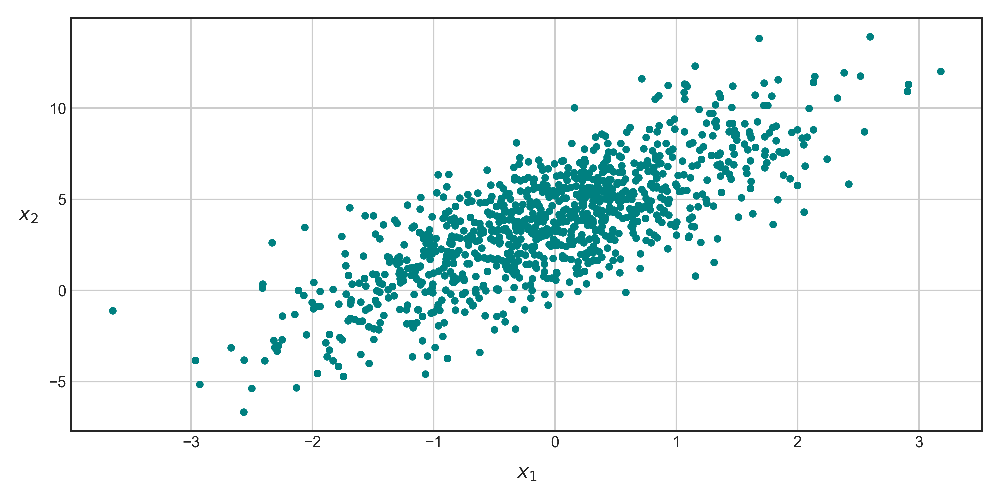

In [8]:
# Visualizamos nuestro conjunto de datos.
fig, ax = plt.subplots(figsize=(10, 5))
ax.scatter(X, y, marker="o", s=20, color="teal")
ax.set_xlabel(r"$x_{1}$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$x_{2}$", fontsize=14, labelpad=15, rotation=0)
ax.grid(True)
plt.tight_layout();

El problema a resolver es entonces $\hat{\mathbf{y} } =b+w\mathbf{x} +\mathbf{\varepsilon } $, donde $b$ y $w$ son los parámetros que debemos estimar.

Debido a que la implementación que hemos construido para el modelo de regresión lineal conforme una estimación por mínimos cuadrados sigue la filosofía de consistencia de la API de **<font color='mediumorchid'>Scikit-Learn</font>**, su aplicación es relativamente simple, conforme lo ya aprendido en la [clase 2.3](https://github.com/rquezadac/udd_data_science_lectures/blob/main/PARTE%20II%20-%20Modelos%20de%20aprendizaje%20supervisado/clase_2_3.ipynb):

In [9]:
# Inicializamos nuestro modelo.
model = OLSRegression()

In [10]:
# Y lo entrenamos conforme nuestro conjunto de datos previamente construido.
model.fit(X, y)

In [11]:
# Obtenemos predicciones conforme nuestro modelo.
y_pred = model.predict(X)

In [12]:
# Recuperamos los coeficientes de este modelo.
b = model.fit_intercept_
w = model.coef_[0]

In [13]:
# Imprimimos los parámetros estimados.
print("Parámetros estimados por el método de mínimos cuadrados:")
print(f"b = {round(b, 3)}")
print(f"w = {round(w, 3)}")

Parámetros estimados por el método de mínimos cuadrados:
b = 3.837
w = 2.484


Podemos observar que nuestro modelo obtiene estimaciones para $b$ y $w$ bastante cercanas a las originalmente utilizadas para generar el conjunto de datos en primera instancia. Naturalmente, la función regresora construida previamente toma la forma de una recta, la cual podemos visualizar rápidamente como sigue:

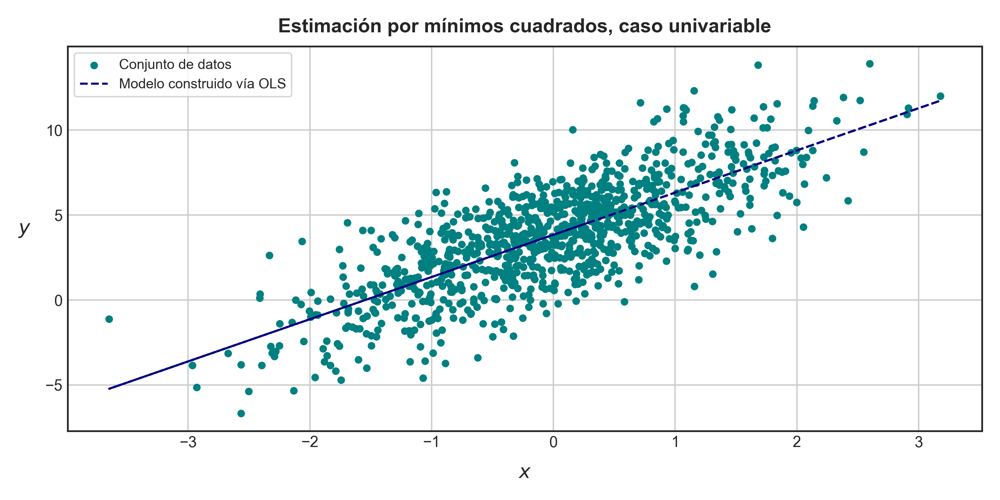

In [14]:
# Visualizamos nuestro conjunto de datos y el modelo construido conforme la estimación por mínimos cuadrados.
fig, ax = plt.subplots(figsize=(10, 5))
ax.scatter(X, y, marker="o", s=20, color="teal", label="Conjunto de datos")
ax.plot(X, y_pred, linestyle="--", color="navy", lw=1.5, label="Modelo construido vía OLS")
ax.set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$y$", fontsize=14, labelpad=15, rotation=0)
ax.set_title("Estimación por mínimos cuadrados, caso univariable", fontsize=14, pad=10, fontweight="bold")
ax.legend(loc="best", frameon=True, fontsize=10)
ax.grid(True)
plt.tight_layout();

La implementación del método de mínimos cuadrados previamente desarrollada para la construcción de un modelo de regresión lineal es independiente del número de variables independientes que conformen la matriz de datos de entrada $\mathbf{X}$. En efecto, si ahora construimos un conjunto de datos representado por el par $\left( \mathbf{X} ,\mathbf{y} \right)  $ tal que $\mathbf{X} =\left( \mathbf{x}_{1} ,\mathbf{x}_{2} \right)  \in \mathbb{R}^{1000\times 2} \wedge \mathbf{y} \in \mathbb{R}^{1000} $, haciendo uso de la misma semilla aleatoria fija definida previamente, tendremos:

In [15]:
# Creamos ahora un conjunto de datos con dos variables independientes.
X = rng.normal(loc=0, scale=1, size=(1000, 2))
y = -3 + 1.5 * X[:, 0] + 2 * X[:, 1] + rng.normal(loc=0, scale=2, size=1000)

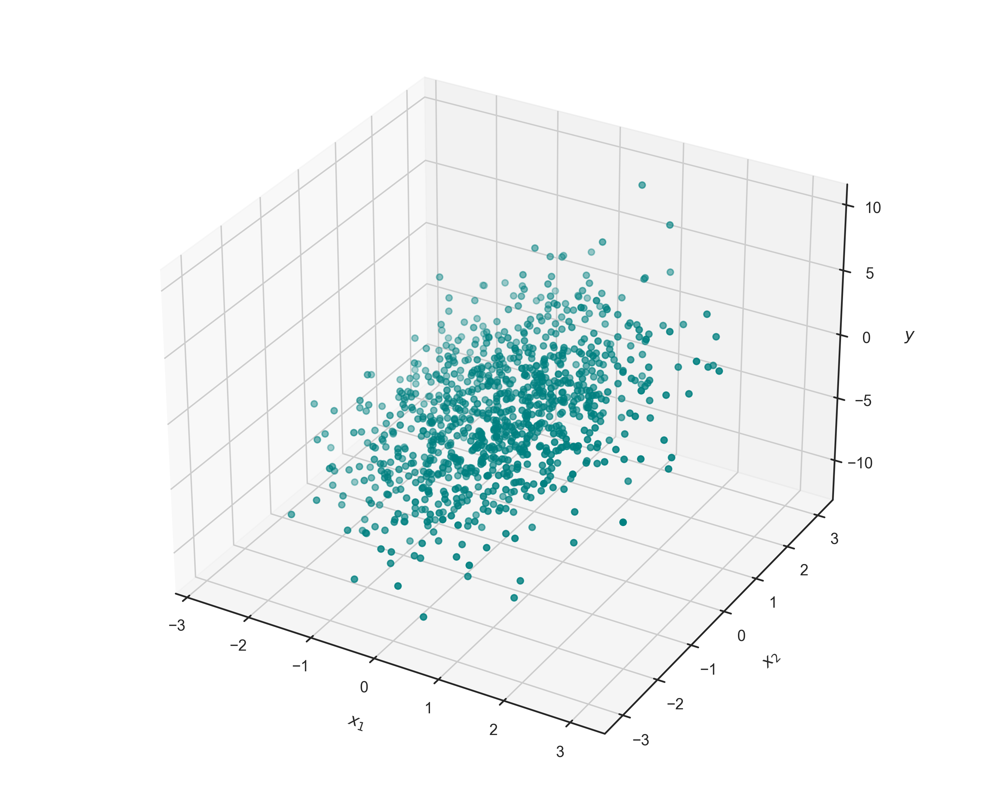

In [16]:
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection="3d")
ax.scatter3D(X[:, 0], X[:, 1], y, s=20, color="teal")
ax.set_xlabel(r"$x_{1}$", fontsize=12, labelpad=10)
ax.set_ylabel(r"$x_{2}$", fontsize=12, labelpad=10)
ax.set_zlabel(r"$y$", fontsize=12, labelpad=10)
plt.tight_layout();

Notemos que, para el conjunto anterior, hemos definido que $\mathbf{y} =-3+1.5\mathbf{x}_{1} +2\mathbf{x}_{2} +\mathbf{\varepsilon } $, donde nuevamente $\mathbf{\varepsilon }$ representa ruido Gaussiano con media nula y desvianción estándar igual a $2$. El problema a resolver es ahora $\hat{\mathbf{y} } =b+w_{1}\mathbf{x}_{1} +w_{2}\mathbf{x}_{2} +\mathbf{\varepsilon } $, donde $b,w_{1}$ y $w_{2}$ son los parámetros a estimar.

Como antes, la aplicación de la clase previamente definida es directa:

In [17]:
# Inicializamos nuestro modelo.
model_2 = OLSRegression()

In [18]:
# Y lo entrenamos conforme nuestro conjunto de datos previamente construido.
model_2.fit(X, y)

In [19]:
# Obtenemos predicciones conforme nuestro modelo.
y_pred = model_2.predict(X)

In [20]:
# Recuperamos los coeficientes de este modelo.
b = model_2.fit_intercept_
w1 = model_2.coef_[0]
w2 = model_2.coef_[1]

In [21]:
# Imprimimos los parámetros estimados.
print("Parámetros estimados por el método de mínimos cuadrados:")
print(f"b = {round(b, 3)}")
print(f"w1 = {round(w1, 3)}")
print(f"w2 = {round(w2, 3)}")

Parámetros estimados por el método de mínimos cuadrados:
b = -3.041
w1 = 1.421
w2 = 1.955


Y nuevamente obtenemos estimaciones muy cercanas a los valores reales.

La función regresora ahora describe un plano de ecuación $\hat{\mathbf{y} } =\hat{b} +\hat{w}_{1} \mathbf{x}_{1} +\hat{w}_{2} \mathbf{x}_{2} $, siendo $\hat{b},\hat{w}_{1}$ y $\hat{w}_{2}$ las estimaciones realizadas para $b,w_{1}$ y $w_{2}$, respectivamente. Podemos visualizar fácilmente este plano en **<font color='mediumorchid'>Scikit-Learn</font>** mediante la incorporación de una grilla tridimensional limitada, en cada dimensión, por los valores extremos de cada una de las variables independientes que conforman a la matriz $\mathbf{X}$. De esta manera, tenemos:

In [22]:
# Generamos el hiperplano que representa nuestra función regresora.
x1 = np.linspace(start=X[:, 0].min(), stop=X[:, 0].max(), num=100)
x2 = np.linspace(start=X[:, 1].min(), stop=X[:, 1].max(), num=100)
X1, X2, = np.meshgrid(x1, x2)
y_pred = b + w1 * X1 + w2 * X2

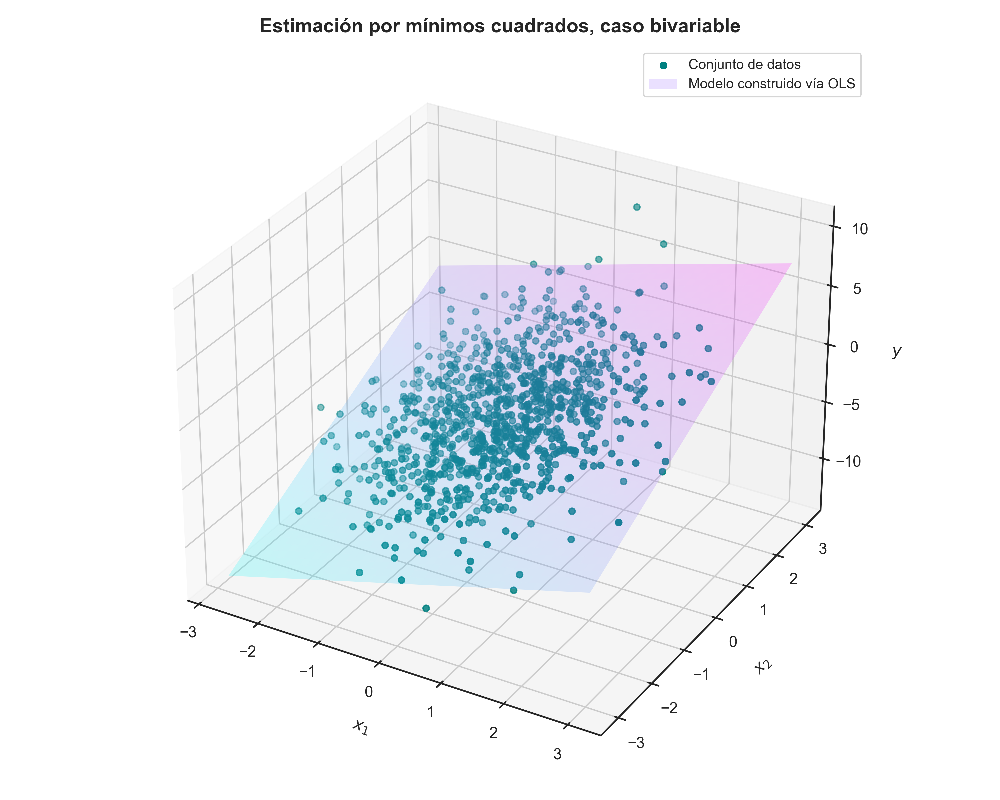

In [23]:
# Visualizamos nuestro conjunto de datos y el modelo construido conforme la estimación por mínimos cuadrados.
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection="3d")
ax.scatter3D(X[:, 0], X[:, 1], y, s=20, color="teal", label="Conjunto de datos")
ax.plot_surface(X1, X2, y_pred, cmap="cool", lw=0, alpha=0.2, label="Modelo construido vía OLS")
ax.set_xlabel(r"$x_{1}$", fontsize=12, labelpad=10)
ax.set_ylabel(r"$x_{2}$", fontsize=12, labelpad=10)
ax.set_zlabel(r"$y$", fontsize=12, labelpad=10)
ax.set_title("Estimación por mínimos cuadrados, caso bivariable", fontsize=14, pad=10, fontweight="bold")
ax.legend(loc="best", frameon=True, fontsize=10)
plt.tight_layout();

Los problemas resueltos previamente son casos muy simples que no deben tomarse como una norma general de los casos de estudio que enfrentaremos en el mundo real. De hecho, incluso, en estos ejemplos hemos definido con anterioridad los valores *reales* de los coeficientes de regresión, lo que nos ha dado una idea de donde debíamos llegar con nuestros modelos. Por supuesto, este difícilmente sea el caso en un contexto más real. ◼︎

#### Solución aproximada por medio del algoritmo de gradiente descendente.
Es evidente que la implementación del método de mínimos cuadrados para la construcción de un modelo de regresión lineal tiene sus ventajas. La más destacable de éstas es que la ecuación normal (4.12) nos provee de una solución algebraica cerrada que garantiza su existencia. Sin embargo, el tiempo de ejecución es un asunto completamente diferente, debido a la existencia de la matriz inversa $\left( \mathbf{X}^{\top } \mathbf{X} \right)^{-1}  $, que puede ser muy difícil de computar, sobretodo cuando los problemas subyacentes no están bien condicionados (por ejemplo, causando que la inversa $\left( \mathbf{X}^{\top } \mathbf{X} \right)^{-1}  $ no exista). Por lo tanto, es común que la estimación de los parámetros de la regresión se realice por medio de métodos de optimización numérica que permitan obtener soluciones aproximadas de gran calidad en un tiempo significativamente menor. Un ejemplo clásico de estas rutinas es, por supuesto, el **algoritmo de gradiente descendente (GD)**, el que fue abordado en detalle en la [clase 1.6](https://github.com/rquezadac/udd_data_science_lectures/blob/main/PARTE%20I%20-%20Fundamentos%20matem%C3%A1ticos%20elementales/clase_1_6.ipynb).

Sea el conjunto de entrenamiento $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right)  :\mathbf{X} \in \mathbb{R}^{m\times n+1} \wedge \mathbf{y} \in \mathbb{R} \right\}$, donde $\mathbf{x}_{i}\in \mathbb{R}^{n+1}$ representa una fila o instancia $i$-ésima de la matriz de datos de entrada $\mathbf{X}$, siendo $m$ el total de instancias de $\mathcal{D}$. En esta representación, estamos considerando nuevamente que $\mathbf{X}$ tiene añadida una columna con $1$s a su izquierda para así considerar el efecto de cualquier parámetro de sesgo propio de un modelo de regresión lineal. De esta manera, estamos nuevamente interesados en estimar una función regresora $f$, tal que $\mathbf{y}=f(\mathbf{X})$, donde $f(\mathbf{X}) =\mathbf{X} \mathbf{w}+\mathbf{\varepsilon}$. Aquí $\mathbf{w}\in \mathbb{R}^{n+1}$ es nuevamente un vector de parámetros que deseamos estimar (los coeficientes de regresión, incluyendo por supuesto al parámetro de sesgo $b=w_{0}$).

Consideremos la función de costo (4.8). Notemos que dicha función difiere del error cuadrático medio únicamente por una constante. En efecto, si $L(\mathbf{w})$ denota al error cuadrático medio en términos del vector $\mathbf{w}$, entonces tenemos que

$$\begin{array}{lll}L\left( \mathbf{w} \right)  &=&\displaystyle \frac{1}{m} \sum^{m}_{i=1} \left( y_{i}-\hat{y}_{i} \right)^{2}  \\ &=&\displaystyle \frac{1}{m} \sum^{m}_{i=1} \left( y_{i}-\sum^{n}_{j=1} x_{ij}w_{j}\right)^{2}  \\ &=&\displaystyle \frac{1}{m} \left\Vert \mathbf{y} -\mathbf{X} \mathbf{w} \right\Vert^{2}  \\ &=&\displaystyle \frac{S\left( \mathbf{w} \right)  }{m} \end{array} $$
<p style="text-align: right;">$(4.14)$</p>

Por lo tanto, el valor mínimo de la suma de cuadrados $S\left( \mathbf{w} \right)  $ coincide con el valor mínimo del error cuadrático medio $L\left( \mathbf{w} \right)  $. De esta manera, el gradiente de $L$ con respecto a $\mathbf{w}$ es

$$\nabla L\left( \mathbf{w} \right)  =\left( \begin{gathered}\displaystyle \frac{\partial L\left( \mathbf{w} \right)  }{\partial w_{0}} \\ \displaystyle \frac{\partial L\left( \mathbf{w} \right)  }{\partial w_{1}} \\ \vdots \\ \displaystyle \frac{\partial L\left( \mathbf{w} \right)  }{\partial w_{n}} \end{gathered} \right)  =\frac{2}{m} \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)^{\top }  \left( -\mathbf{X} \right)  $$
<p style="text-align: right;">$(4.15)$</p>

Con el gradiente expresado en términos de $\mathbf{w}$, lo único que nos queda pendiente es insertar la fórmula (4.15) en la rutina del algoritmo de gradiente descendente. Es decir, para una secuencia o **programa de aprendizaje** consistente de $k$ iteraciones del algoritmo, el valor de $\mathbf{w}$ en la iteración $k$ será

$$\mathbf{w}^{\left( k\right)  } =\mathbf{w}^{\left( k-1\right)  } -\gamma \nabla L\left( \mathbf{w}^{\left( k-1\right)  } \right)  $$
<p style="text-align: right;">$(4.16)$</p>

donde $\gamma$ es la **tasa de aprendizaje** del algoritmo. 

Notemos que la fórmula (4.15) hace uso del conjunto de entrenamiento completo (es decir, hace uso de la matriz $\mathbf{X}$ completa), razón por la cual la implementación definida por la ecuación (4.16) es frecuentemente llamada **gradiente descendente en batch o por lotes** (del inglés *batch gradient descent*, o **BGD**), porque utilizamos una única muestra (*batch* o lote) del conjunto de entrenamiento en cada paso. Esto puede derivar en problemas de rendimiento por efecto del número de cálculos requeridos cuando $\mathbf{X}$ es muy grande en términos del número de instancias $m$, aunque el efecto de agregar más variables al modelo no es demasiado costoso (porque equivale al cálculo de una derivada parcial adicional).

**Ejemplo 4.2 – El efecto de la tasa de aprendizaje:** La implementación de un modelo de regresión lineal con coeficientes estimados por medio del algoritmo de gradiente descendente de tipo batch (BGD) es muy sencilla de implementar en Python. Para ilustrarlo, crearemos una clase que mantenga la consistencia de la API de **<font color='mediumorchid'>Scikit-Learn</font>** para su aplicación, de la misma forma que lo hicimos para el caso de la estimación por mínimos cuadrados. En esta oportunidad, nuestra clase se llamará `BGDRegression`, para diferenciar cada implementación (y le agregaremos una barra de progreso):

In [24]:
from tqdm import tqdm

In [25]:
# Definimos nuestro estimador por medio de una clase.
class BGDRegression:
    def __init__(self, n_epochs=1000, learning_rate=0.1, random_state=42):
        """
        Inicialización de nuestra implementación. Aquí simplemente establecemos las 'cajas' en las 
        cuales vamos a almacenar los valores resultantes del modelo de regresión lineal 
        (coeficientes del modelo y parámetro de sesgo o intercepción).

        Parámetros:
        -----------
        n_epochs : Número de iteraciones requerido para el algoritmo BGD.
        learing_rate : Tasa de aprendizaje del algoritmo.
        random_state : Parámetro que permite reproducir el resultado del algoritmo por medio de la intro-
            ducción de una semilla aleatoria fija.
        
        """
        self.coef_ = None
        self.fit_intercept_ = None
        self.n_epochs = n_epochs
        self.learning_rate = learning_rate
        self.random_state = random_state

    def fit(self, X, y):
        """
        Procedimiento de ajuste por medio de una estimación por mínimos cuadrados, a fin de determinar
        los coeficientes de regresión de nuestro modelo.

        Parámetros:
        -----------
        X : Arreglo 2D de dimensión (n_instances, n_features) que aglutina toda la información de entrada 
        necesaria para entrenar nuestro modelo. En este caso `n_instances` representa el número de
        instancias del conjunto de datos y `n_features` representa el número de variables independientes
        del mismo.
        y : Arreglo 1D con los valores de respuesta usados como base para entrenar nuestro modelo.
        
        """
        # Añadimos una columna con 1s a la izquierda de la matriz X.
        X_biased = np.c_[np.ones((X.shape[0], 1)), X]
        m = X_biased.shape[0]

        # Inicializamos los parámetros del modelo de manera aleatoria.
        seed = self.random_state
        rng = np.random.default_rng(seed)
        w = rng.random(X_biased.shape[1])

        # Implementamos el algoritmo BGD por medio de un loop muy sencillo.
        for epoch_k in tqdm(range(self.n_epochs), desc="Generando búsqueda de parámetros óptimos vía BGD"):
            # Calculamos el gradiente de la función de costo (error cuadrático medio).
            gradient_k = (2 / m) * (y - X_biased @ w).T @ (-X_biased)

            # Actualizamos los coeficientes de regresión.
            w -= self.learning_rate * gradient_k

        # Asignamos los valores calculados.
        self.coef_ = w[1:]
        self.fit_intercept_ = w[0]

        return self

    def predict(self, X):
        """
        Método que permite obtener predicciones por medio de nuestro modelo.

        Parámetros:
        -----------
        X : Arreglo 2D de dimensión (n_instances, n_features) que aglutina toda la información de entrada 
        necesaria para entrenar nuestro modelo. En este caso `n_instances` representa el número de
        instancias del conjunto de datos y `n_features` representa el número de variables independientes
        del mismo.

        Retorna:
        --------
        y_hat : Predicción realizada por el modelo.
        
        """
        # Añadimos una columna con 1s a la izquierda de la matriz X.
        X_biased = np.c_[np.ones((X.shape[0], 1)), X]

        # Calculamos la estimación para y usando nuestro modelo.
        y_hat = X_biased.dot(np.r_[self.fit_intercept_, self.coef_])
        
        return y_hat

La implementación es más bien sencilla, ya que hemos *reciclado* bastante código del utilizado para crear nuestra implementación casera de la estimación por mínimos cuadrados.

Para probar nuestra implementación, el camino a seguir será exactamente el mismo que el transitado para testear nuestro estimador de mínimos cuadrados (de ahí la *consistencia*). Es decir, instanciaremos nuestro modelo en una variable (que llamaremos `model`), entrenaremos dicho modelo sobre el conjunto de datos haciendo uso del método `fit()`, y luego obtendremos predicciones haciendo uso del método `predict()`:

In [26]:
# Instanciamos nuestro modelo.
model = BGDRegression()

In [27]:
# Y luego lo entrenamos.
model.fit(X, y)

Generando búsqueda de parámetros óptimos vía BGD: 100%|████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 52328.72it/s]


In [28]:
# Obtenemos predicciones conforme nuestro modelo.
y_pred = model.predict(X)

De lo anterior, la obtención de los parámetros de la regresión resulta sencilla:

In [29]:
# Recuperamos los coeficientes de este modelo.
b = model.fit_intercept_
w1 = model.coef_[0]
w2 = model.coef_[1]

In [30]:
# Imprimimos los parámetros estimados.
print("Parámetros estimados por el método de mínimos cuadrados:")
print(f"b = {round(b, 3)}")
print(f"w1 = {round(w1, 3)}")
print(f"w2 = {round(w2, 3)}")

Parámetros estimados por el método de mínimos cuadrados:
b = -3.041
w1 = 1.421
w2 = 1.955


Estos parámetros son prácticamente *iguales* a los obtenidos previamente por medio del estimador de mínimos cuadrados, lo que pone de manifiesto la utilidad del algoritmo de gradiente descendente como eje central de la estimación de parámetros en modelos de naturaleza lineal (por muy *generales* que éstos sean, como veremos más adelante).

Ahora evaluaremos el efecto de elegir una tasa de aprendizaje muy pequeña o muy grande para el algoritmo de gradiente descendente, a fin de tener una idea completa de la importancia de este hiperparámetro. Para ello, simplificaremos la implementación a una del tipo funcional, a fin de poder insertarla de manera sencilla en un bucle que permita trazar todas las curvas resultantes de los parámetros estimados en cada iteración del algoritmo. Para efectos prácticos, haremos uso de un conjunto de datos univariable del tipo $\left\{ x_{i},y_{i}\right\}^{m}_{i=1}  ;x_{i}\in \mathbb{R} \wedge y_{i}\in \mathbb{R}$, que generaremos igualmente de manera aleatoria. 

Usaremos como base la ecuación $y=3x -1$, y agregaremos un nivel constante de ruido Gaussiano (de media nula) a esta expresión a fin de dificultar la labor del algoritmo de gradiente descendente a la hora de estimar los parámetros de la regresión:

In [31]:
# Generamos un arreglo de números en el rango [-5, 5].
X = np.linspace(start=-5, stop=5, num=100)

In [32]:
# Y construimos nuestra variable de respuesta.
noise = rng.normal(loc=0, scale=5, size=100)
y = 3 * X - 1 + noise

Nuestro conjunto de datos tiene la siguiente estructura:

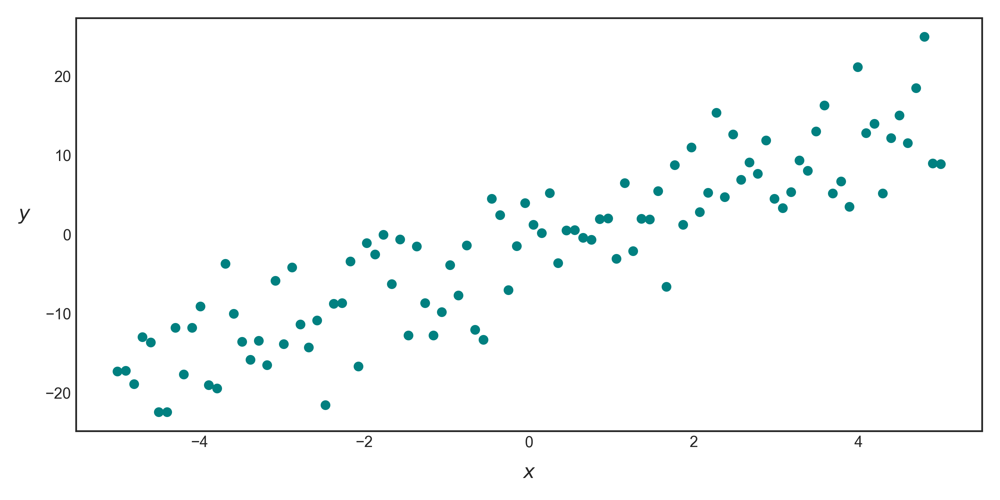

In [33]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.scatter(X, y, color="teal")
ax.set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$y$", fontsize=14, labelpad=15, rotation=0)
plt.tight_layout();

En el siguiente bloque de código, construiremos una función que implementará un bucle sencillo en el cual haremos variar la tasa de aprendizaje del algoritmo, almacenando en cada caso la trayectoria completa del mismo (todos los valores que toma el vector de parámetros $\mathbf{w}$ en cada iteración):

In [34]:
# Definimos una función que implementa el algoritmo BGD para nuestro caso particular.
def batch_gradient_descent(X, y, learning_rate=0.01, n_iter=3000, random_state=42):
    # Añadimos una columna con 1s a la izquierda de la matriz X.
    X_biased = np.c_[np.ones((X.shape[0], 1)), X]

    # Número total de observaciones en el lote.
    m = X_biased.shape[0] 

    # Adecuamos y en un arreglo bidimensional.
    y = y.reshape(-1, 1) 

    # Definimos una lista vacía donde almacenaremos la trayectoria del algoritmo.
    w_path = [] 

    # Inicializaremos el algoritmo con un valor aleatorio para nuestros parámetros.
    rng = np.random.default_rng(random_state)
    w0 = rng.normal(loc=0, scale=1, size=(2, 1))
    wk = w0.copy()

    # Y finalmente implementamos el procedimiento del algoritmo BGD.
    for iter_k in range(n_iter):
        gradient_k = (2/m) * X_biased.T @ (X_biased @ wk - y)
        wk -= learning_rate * gradient_k
        w_path.append(wk.copy())
    
    return wk, w_path

Ya sólo nos resta resolver el problema por medio de nuestra función. El vector de parámetros de la regresión se almacenará en la variable `w_bgd`, mientras que la trayectoria completa del algoritmo se almacenará en la variable `path_bgd`:

In [35]:
# Resolvemos el problema usando el algoritmo BGD.
w_bgd, path_bgd = batch_gradient_descent(X, y)

In [36]:
# Mostramos en pantalla la solución que hemos estimado.
print(f"Valor de w = {w_bgd[0].round(3)[0]}")
print(f"Valor de b = {w_bgd[1].round(3)[0]}")

Valor de w = -1.605
Valor de b = 3.269


Observamos que las estimaciones obtenidas de los parámetros son cercanas a las que hemos usado para generar nuestro conjunto de datos (recordemos, $w=3\wedge b=-1$). El modelo final puede representarse gráficamente como sigue:

In [37]:
# Generamos las predicciones de nuestro modelo.
y_pred = np.c_[np.ones((X.shape[0], 1)), X] @ w_bgd

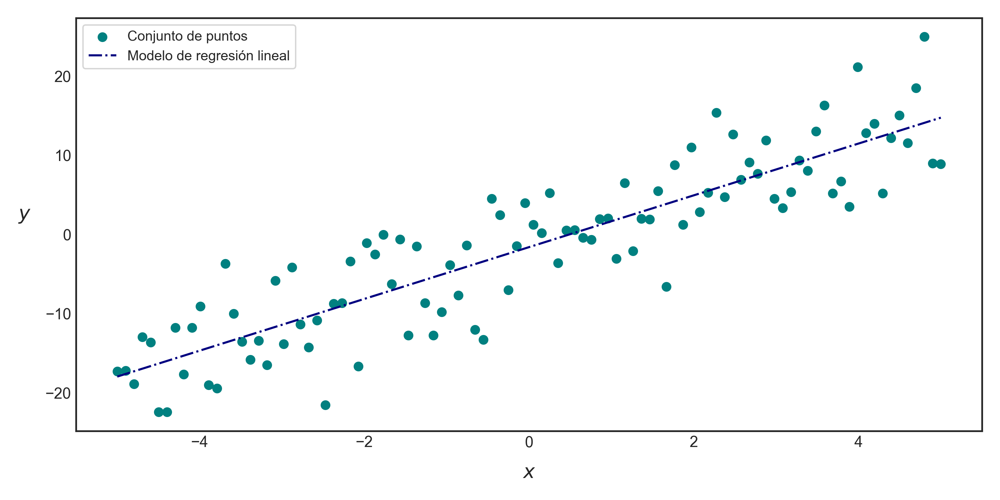

In [38]:
# Graficamos los resultados del modelo.
fig, ax = plt.subplots(figsize=(10, 5))
ax.scatter(X, y, color="teal", label="Conjunto de puntos")
ax.plot(X, y_pred, linestyle="-.", color="navy", label="Modelo de regresión lineal")
ax.set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$y$", fontsize=14, labelpad=15, rotation=0)
ax.legend(loc="best", fontsize=10, frameon=True)
plt.tight_layout();

Ahora visualizaremos la trayectoria del algoritmo haciendo uso de la lista `path_bgd`. Debido a que el número de iteraciones del algoritmo es alto, mostraremos todas las rectas construidas en cada caso, pero cada cuatro iteraciones:

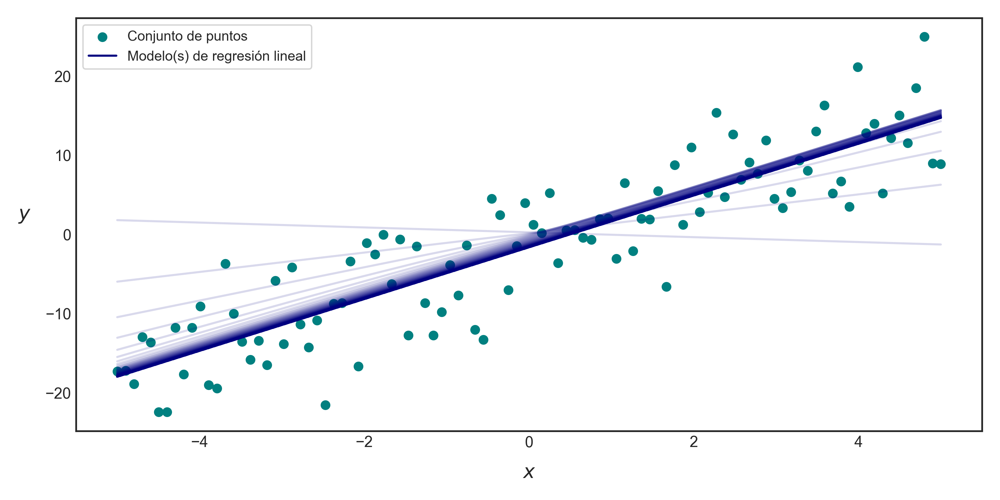

In [39]:
# Graficamos la trayectoria del algoritmo.
fig, ax = plt.subplots(figsize=(10, 5))
ax.scatter(X, y, color="teal", label="Conjunto de puntos")
ax.plot(X, y_pred, linestyle="-", color="navy", label="Modelo(s) de regresión lineal")

for k in range(0, len(path_bgd), 3):
    y_pred_k = np.c_[np.ones((X.shape[0], 1)), X] @ path_bgd[k]
    ax.plot(X, y_pred_k, color="navy", alpha=0.15)

ax.set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$y$", fontsize=14, labelpad=15, rotation=0)
ax.legend(loc="best", fontsize=10, frameon=True)
plt.tight_layout();

Podemos observar que el algoritmo necesita muchísimas menos iteraciones que las 3000 que hemos definido a priori en nuestra implementación, lo que se hace evidente porque la mayoría de las rectas dibujadas en el gráfico anterior son muy cercanas a la del modelo final. Esto podemos observarlo de manera mucho más clara al graficar esta misma trayectoria en el espacio de parámetros completo:

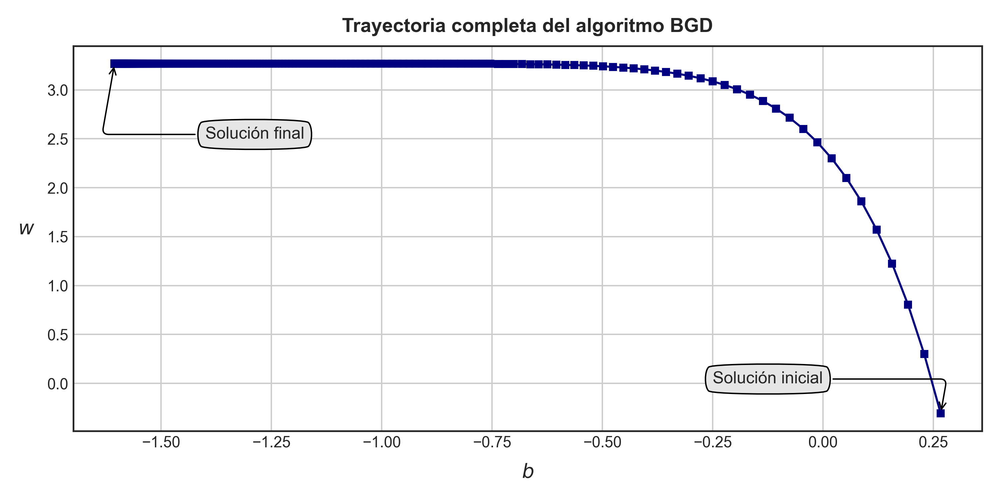

In [40]:
# Construimos el espacio de parámetros completo.
param_space_bgd = np.vstack(
    [
        [path_bgd[k][0][0] for k in range(len(path_bgd))], 
        [path_bgd[k][1][0] for k in range(len(path_bgd))],
    ]
).T
# Graficamos la trayectoria del algoritmo en este espacio.
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(param_space_bgd[:, 0], param_space_bgd[:, 1], marker="s", markersize=5, color="navy")
ax.annotate(
    "Solución inicial", xy=(param_space_bgd[0, 0], param_space_bgd[0, 1]), xytext=(-0.25, 0.0),
    xycoords='data', fontsize=12, bbox=dict(boxstyle="round4,pad=.5", fc="0.9", color="black"),
    arrowprops=dict(
        arrowstyle="->", connectionstyle="angle,angleA=0,angleB=80,rad=20", color="black",
    ),
)
ax.annotate(
    "Solución final", xy=(param_space_bgd[-1, 0], param_space_bgd[-1, 1]), xytext=(-1.4, 2.5),
    xycoords='data', fontsize=12, bbox=dict(boxstyle="round4,pad=.5", fc="0.9", color="black"),
    arrowprops=dict(
        arrowstyle="->", connectionstyle="angle,angleA=0,angleB=80,rad=20", color="black",
    ),
)
ax.set_xlabel(r"$b$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$w$", fontsize=14, labelpad=15, rotation=0)
ax.grid(True)
ax.set_title("Trayectoria completa del algoritmo BGD", fontsize=14, fontweight="bold", pad=10)
plt.tight_layout();

El algoritmo tarda muchísimo en converger, y los pasos que toma a medida que se acerca a la solución final del problema de regresión son cada vez más y más pequeños. Cuando las diferencias entre los valores de los parámetros que estimamos entre cada iteración son despreciables (es decir, menores que cierta diferencia umbral o **tolerancia**), es razonable introducir un mecanismo que rompa los bucles de cálculo al alcanzar dicha tolerancia en cada paso. Existen aplicaciones que incluso permiten que dicha tolerancia sea superada durante un total de $r$ iteraciones sucesivas, rompiendo el bucle si las diferencias entre los parámetros estimados no superan ese valor. El hiperparámetro $r$ es llamado comúnmente **paciencia** asociada a la correspondiente implementación. ◼︎

#### Gradiente descendente estocástico.
El principal problema del algoritmo BGD, radica en el hecho de que utiliza el conjunto de entrenamiento completo para computar los gradientes en cada paso, lo que genera que dicho gradiente sea de muy lenta variación cuando el conjunto de entrenamiento es muy grande, lo que observamos en el ejemplo anterior. Para estos casos, suele ser buena idea implementar otro tipo de soluciones.

El **algoritmo de gradiente descendente estocástico** (**SGD**, del inglés *stochastic gradient descent*) es una variante del algoritmo de gradiente descendente tradicional que es particularmente útil cuando se trabaja con grandes volúmenes de datos, dado que permite actualizaciones más rápidas de los parámetros del modelo en cada iteración utilizando solo un subconjunto (un lote o *batch* pequeño o incluso un solo dato) de todo el conjunto de datos de entrenamiento.

Naturalmente, toda esta eficiencia no es *gratis*. En vez de generar un descenso seguro hacia el mínimo (con una convergencia garantizada), los valores estimados por el algoritmo SGD para la función de costo oscilarán en una región que contiene a su valor óptimo, generándose así un decrecimiento promedio. Una vez que se llega al mínimo, el algoritmo continuará oscilando hasta el momento de su detención. Esto genera que, en la iteración final, los ajustes logrados por el algoritmo sean muy buenos (o *eso esperamos*), pero no óptimos.

Debido a la aleatorización del algoritmo, la trayectoria del mismo hacia el óptimo no es tan *bonita* como la que pudimos visualizar en el caso del algoritmo BGD, sino que suele ser muchísimo más errática, evidenciándose las oscilaciones del mismo en torno al óptimo. La ventaja, por supuesto, será (ojalá) siempre el menor número de iteraciones y el hecho de que cada iteración requiere de una menor cantidad de datos para su ejecución, lo que disminuye el tiempo que tarda el algoritmo en resolver el problema. Por regla general, a fin de reducir las oscilaciones en torno al óptimo, suele ser buena idea introducir un **procedimiento adaptativo** que permita que la tasa de aprendizaje pueda variar conforme la progresión del algoritmo, haciendo que sus valores sean cada vez más pequeños a medida que éste comienza a converger. De esta manera, **la tasa de aprendizaje se convierte en una cantidad variable** (es decir, si $k$ es el número de iteraciones del algoritmo, la tasa de aprendizaje $\gamma$ será ahora una función del tipo $\gamma(k)= \gamma_{k}$, llamada **programa de aprendizaje**), siendo su expresión dependiente de las condiciones del problema. Tales expresiones suelen depender de las propiedades geométricas locales de la función objetivo (que, en un problema de regresión lineal, siempre es convexa). Como resultado, hay dos heurísticas simples que podemos seguir (Toussaint, 2012):

- Cuando el valor de la función se incrementa después de una iteración (digamos, la $r$-ésima), aquello significa que el paso $\gamma_{r}$ fue demasiado largo. Por lo tanto, requerimos rehacer esta iteración con un valor de más pequeño que el que hemos usado.
- Cuando el valor de la función objetivo decrece después de una iteración (digamos, la $r$-ésima), siempre está la posibilidad de que el paso $\gamma_{r}$ haya sido más grande y, por tanto, que la convergencia del algoritmo sea más rápida. Por lo tanto, podemos volver atrás y aumentar el valor de $\gamma_{r}$.

A pesar de que el volver atrás y mejorar los valores de $\gamma_{r}$ puede parecer un desperdicio de recursos, esta sencilla heurística garantiza que el algoritmo de gradiente descendente siempre converja al mínimo global de nuestra función objetivo.

**Ejemplo 4.3 – Visualización de la trayectoria del algoritmo SGD:** Consideremos el mismo problema que resolvimos en el ejemplo (4.2) para describir la trayectoria completa del algoritmo BGD. Recordemos que el conjunto de datos es univariable, conformado por pares del tipo $\left\{ x_{i},y_{i}\right\}^{m}_{i=1}  ;x_{i}\in \mathbb{R} \wedge y_{i}\in \mathbb{R} $, donde la función generadora de estos pares es $y=4x- 3$, y a la cual agregamos algo de ruido Gaussiano para dificultar un poco la acción del algoritmo de gradiente descendente en la tarea de estimar los parámetros *reales* $w=4\wedge b=-3$:

In [41]:
# Generamos un arreglo de números en el rango [-5, 5].
X = np.linspace(start=-5, stop=5, num=100)

In [42]:
# Y construimos nuestra variable de respuesta.
noise = rng.normal(loc=0, scale=5, size=100)
y = 4 * X - 3 + noise

Construiremos ahora una implementación (funcional) desde cero del algoritmo SGD con un control adaptativo de la tasa de aprendizaje. Dicho control, como mencionamos previamente, se logra de manera sencilla por medio de la introducción de un programa de aprendizaje, el cual no es más que una función que controla el valor de este hiperparámetro conforme el número de iteraciones del algoritmo.

Dada la naturaleza estocástica del algoritmo SGD, no queremos recorrer el conjunto de datos en su totalidad, sino que tomaremos muestras aleatorias cada vez. Cada ronda de iteraciones se denominará **época** (del inglés *epoch*). En contraste con la implementación del algoritmo BGD, donde recorrimos el conjunto de datos un total de 3000 veces en el ejemplo (4.2) (3000 iteraciones en total), acá lo haremos sólo 50 veces (menos de un 2% de lo hecho en el caso del algoritmo BGD): Por esa razón, setearemos nuestra implementación con 50 épocas, y un programa de aprendizaje definido en base a la función

$$\gamma =\frac{t_{0}}{t+t_{r}} \  ;\  t=n_{ep}m+k$$
<p style="text-align: right;">$(4.17)$</p>

Donde $t_{0}$ y $t_{r}$ son hiperparámetros que acotan la magnitud de la tasa de aprendizaje, $n_{ep}$ es el correspondiente número de época en un determinado momento, $m$ es el número de instancias del conjunto de entrenamiento y $k$ es la iteración propiamente tal.

De esta manera:

In [43]:
# Definimos la función que controlará el programa de aprendizaje del algoritmo.
def learning_schedule(t, t0=5, tr=50):
    return t0 / (t + tr)

In [44]:
# Creamos una función para implementar el algoritmo SGD.
def stochastic_gradient_descent(X, y, n_epochs=50, random_state=42):
    # Defnimos una semilla aleatoria fija.
    rng = np.random.default_rng(random_state)
    
    # Añadimos una columna con 1s a la izquierda de la matriz X.
    X_biased = np.c_[np.ones((X.shape[0], 1)), X]

    # Número total de observaciones en el lote.
    m = X_biased.shape[0]

    # Adecuamos Y en un arreglo bidimensional.
    y = y.reshape(-1, 1)

    # Inicializaremos el algoritmo con un valor aleatorio para nuestros parámetros.
    w0 = rng.normal(loc=0, scale=1, size=(2, 1))
    w = w0.copy()

    # Una lista vacía donde almacenaremos la trayectoria del algoritmo.
    w_path = []
    
    # Implementación del algoritmo.
    for epoch_r in range(n_epochs):
        for iter_k in range(m):
            
            # Construimos un índice aleatorizado.
            rand_idx = rng.integers(m)
            
            # Generamos la selección aleatorizada de puntos del conjunto completo.
            X_rk = X_biased[rand_idx:rand_idx + 1]
            y_rk = y[rand_idx:rand_idx + 1]
            
            # Cálculo del gradiente.
            grad_rk = 2 * X_rk.T @ (X_rk @ w - y_rk) # No dividimos por m, para evitar errores.
            
            # Actualización de la tasa de aprendizaje.
            gamma_rk = learning_schedule(epoch_r * m + iter_k)
            
            # Actualización de parámetros.
            w -= gamma_rk * grad_rk
            w_path.append(w.copy())
    
    return w, w_path

Con nuestra implementación ya construida, simplemente bastará con aplicarla directamente:

In [45]:
w_sgd, path_sgd = stochastic_gradient_descent(X, y)

La solución estimada para los parámetros de la regresión es la siguiente:

In [46]:
# Mostramos en pantalla la solución que hemos estimado.
print(f"Valor de w = {w_sgd[0].round(3)[0]}")
print(f"Valor de b = {w_sgd[1].round(3)[0]}")

Valor de w = -2.759
Valor de b = 4.244


Y la trayectoria del algoritmo puede graficarse de la misma forma que en el caso del ejemplo (4.2):

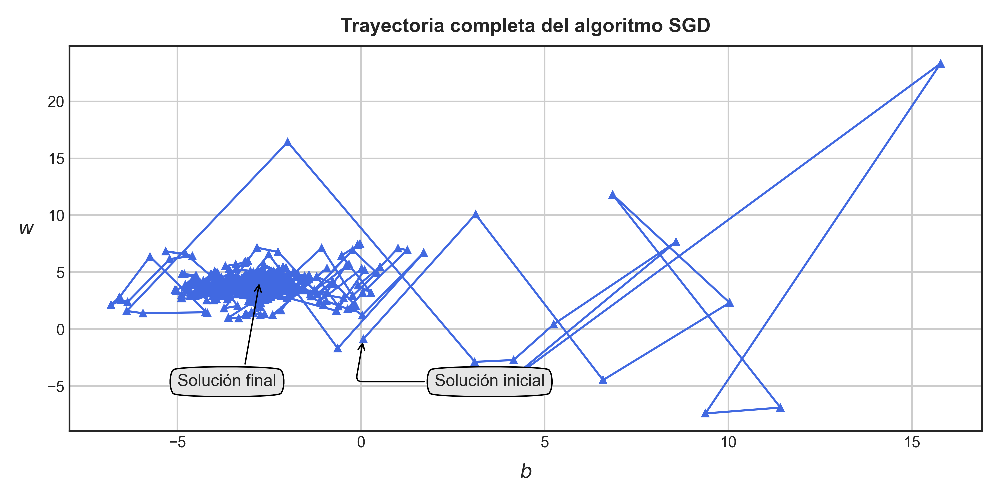

In [47]:
# Construimos el espacio de parámetros completo.
param_space_sgd = np.vstack(
    [
        [path_sgd[k][0][0] for k in range(0, len(path_sgd))], 
        [path_sgd[k][1][0] for k in range(0, len(path_sgd))],
    ]
).T
# Graficamos la trayectoria del algoritmo en este espacio.
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(param_space_sgd[:, 0], param_space_sgd[:, 1], marker="^", markersize=5, color="royalblue")
ax.annotate(
    "Solución inicial", xy=(param_space_sgd[0, 0], param_space_sgd[0, 1]), xytext=(2, -5),
    xycoords='data', fontsize=12, bbox=dict(boxstyle="round4,pad=.5", fc="0.9", color="black"),
    arrowprops=dict(
        arrowstyle="->", connectionstyle="angle,angleA=0,angleB=80,rad=20", color="black",
    ),
)
ax.annotate(
    "Solución final", xy=(param_space_sgd[-1, 0], param_space_sgd[-1, 1]), xytext=(-5, -5),
    xycoords='data', fontsize=12, bbox=dict(boxstyle="round4,pad=.5", fc="0.9", color="black"),
    arrowprops=dict(
        arrowstyle="->", connectionstyle="angle,angleA=0,angleB=80,rad=20", color="black",
    ),
)
ax.set_xlabel(r"$b$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$w$", fontsize=14, labelpad=15, rotation=0)
ax.grid(True)
ax.set_title("Trayectoria completa del algoritmo SGD", fontsize=14, fontweight="bold", pad=10)
plt.tight_layout();

Podemos observar que la trayectoria del algoritmo SGD es muchísimo más errática que la descrita por el algoritmo BGD, existiendo incluso saltos a regiones bastante más lejanas del entorno en el cual se localiza la solución del problema de interés. No obstante, la porción final de esta trayectoria tiende igualmente a oscilar en torno al óptimo. ◼︎

**Ejemplo 4.4 – Gradiente descendente con moméntum:** Las implementaciones anteriores, con sus ventajas y desventajas, pueden resultar ser algo lentas cuando el conjunto de entrenamiento es demasiado grande. Para ganar algo de control respecto de aquello, podemos introducir un término adicional que permite tener un cierto nivel de **memoria** relativa al desplazamiento del algoritmo en la iteración previa a la actual. Esta memoria provoca que las oscilaciones del algoritmo se *regularicen* a medida que los valores del gradiente de la función objetivo de van actualizando. Si nos ceñimos a nuestra analogía de buscar el valle más profundo en una montaña (siendo la montaña la *gráfica* de la función objetivo), este término de memoria emula la noción de inercia al movimiento: Nos cuesta más iniciar el movimiento que frenarlo. El procedimiento así definido se denomina **gradiente descendente con moméntum** (GDM).

La idea pues es disponer de un gradiente con memoria tal que sea posible implementar un movimiento promedio para el algoritmo GD. El método “recuerda”, por tanto, el desplazamiento o actualización $\triangle \mathbf{x}_{k}$ para la iteración $k$, y determina el próximo movimiento como una combinación lineal de los gradientes actual y anterior. De este modo, el algoritmo GDM toma la forma

$$\begin{array}{lll}\mathbf{w}^{\left( k\right)  } &=&\mathbf{w}^{\left( k-1\right)  } -\gamma^{\left( k-1\right)  } \nabla L\left( \mathbf{w}^{\left( k-1\right)  } \right)  +\alpha \triangle \mathbf{w}^{\left( k-1\right)  } \\ \triangle \mathbf{w}^{\left( k-1\right)  } &=&\mathbf{w}^{\left( k-1\right)  } -\mathbf{w}^{\left( k-2\right)  } \end{array} $$
<p style="text-align: right;">$(4.18)$</p>

Donde $\alpha$ es un hiperparámetro llamado **moméntum** del algoritmo, y es tal que $0\leq \alpha \leq 1$.

Con frecuencia, sólo tendremos estimaciones para los valores del gradiente en pasos intermedios. En tales casos, el hiperparámetro de moméntum resulta ser de utilidad, dado que permite obtener promedios de estimaciones de los respectivos gradientes que muchas veces llevan consigo un nivel significativo de ruido. Una forma particular de generar estimaciones de los gradientes es mediante el uso de una aproximación estocástica, lo que de hecho hacemos al implementar el algoritmo SGD.

En este ejercicio, construiremos una implementación del algoritmo SGD con moméntum, reciclando lo que más podamos de los ejercicios anteriores. Esto implica simplemente agregar una línea adicional donde se calcula el término dependiente de $\alpha$ como sigue:

In [48]:
# Creamos una función para implementar el algoritmo SGD con moméntum.
def momentum_sgd(X, y, alpha=0.9, n_epochs=50, random_state=42):
    # Defnimos una semilla aleatoria fija.
    rng = np.random.default_rng(random_state)
    
    # Añadimos una columna con 1s a la izquierda de la matriz X.
    X_biased = np.c_[np.ones((X.shape[0], 1)), X]

    # Número total de observaciones en el lote.
    m = X_biased.shape[0]

    # Adecuamos Y en un arreglo bidimensional.
    y = y.reshape(-1, 1)

    # Inicializaremos el algoritmo con un valor aleatorio para nuestros parámetros.
    w0 = rng.normal(loc=0, scale=1, size=(2, 1))
    w = w0.copy()

    # Inicializaremos igualmente un vector de moméntum (con valores nulos).
    v = np.zeros_like(w)
    
    # Una lista vacía donde almacenaremos la trayectoria del algoritmo.
    w_path = []
    
    # Implementación del algoritmo.
    for epoch_r in range(n_epochs):
        for iter_k in range(m):
            
            # Construimos un índice aleatorizado.
            rand_idx = rng.integers(m)
            
            # Generamos la selección aleatorizada de puntos del conjunto completo.
            X_rk = X_biased[rand_idx:rand_idx + 1]
            y_rk = y[rand_idx:rand_idx + 1]
            
            # Cálculo del gradiente.
            grad_rk = 2 * X_rk.T @ (X_rk @ w - y_rk) # No dividimos por m, para evitar errores.
            
            # Actualización de la tasa de aprendizaje.
            gamma_rk = learning_schedule(epoch_r * m + iter_k)

            # Aplicación del moméntum.
            v = alpha * v - gamma_rk * grad_rk
            
            # Actualización de parámetros.
            w += v
            w_path.append(w.copy())
    
    return w, w_path

In [49]:
w_msgd, path_msgd = momentum_sgd(X, y, alpha=0.9)

La solución estimada para los parámetros de la regresión, para el caso del algoritmo SGD con moméntum, es la siguiente:

In [50]:
# Mostramos en pantalla la solución que hemos estimado.
print(f"Valor de w = {w_msgd[0].round(3)[0]}")
print(f"Valor de b = {w_msgd[1].round(3)[0]}")

Valor de w = -3.186
Valor de b = 4.0


Y como siempre, graficamos la trayectoria del algoritmo:

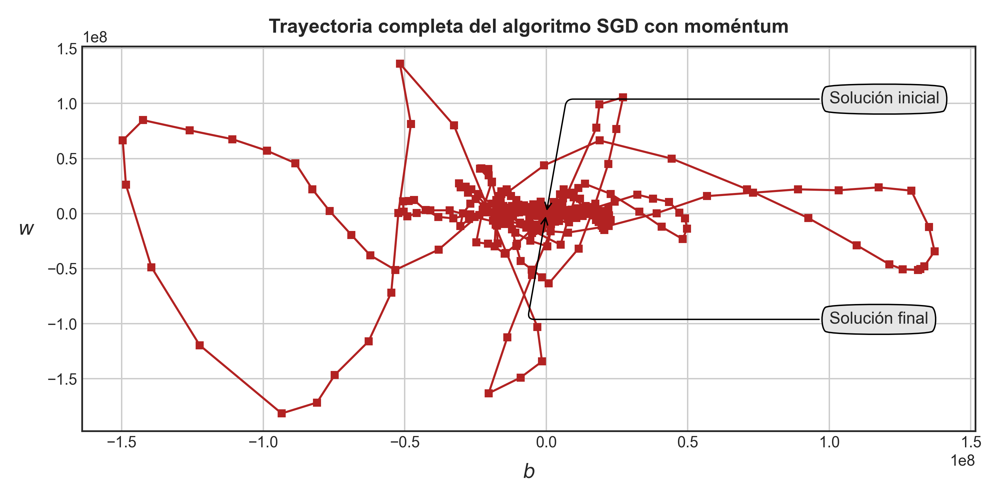

In [51]:
# Construimos el espacio de parámetros completo.
param_space_msgd = np.vstack(
    [
        [path_msgd[k][0][0] for k in range(0, len(path_msgd))], 
        [path_msgd[k][1][0] for k in range(0, len(path_msgd))],
    ]
).T
# Graficamos la trayectoria del algoritmo en este espacio.
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(param_space_msgd[:, 0], param_space_msgd[:, 1], marker="s", markersize=5, color="firebrick")
ax.annotate(
    "Solución inicial", xy=(param_space_msgd[0, 0], param_space_msgd[0, 1]), xytext=(1.0e+8, 1.0e+8),
    xycoords='data', fontsize=12, bbox=dict(boxstyle="round4,pad=.5", fc="0.9", color="black"),
    arrowprops=dict(
        arrowstyle="->", connectionstyle="angle,angleA=0,angleB=80,rad=20", color="black",
    ),
)
ax.annotate(
    "Solución final", xy=(param_space_msgd[-1, 0], param_space_msgd[-1, 1]), xytext=(1.0e+8, -1.0e+8),
    xycoords='data', fontsize=12, bbox=dict(boxstyle="round4,pad=.5", fc="0.9", color="black"),
    arrowprops=dict(
        arrowstyle="->", connectionstyle="angle,angleA=0,angleB=80,rad=20", color="black",
    ),
)
ax.set_xlabel(r"$b$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$w$", fontsize=14, labelpad=15, rotation=0)
ax.grid(True)
ax.set_title("Trayectoria completa del algoritmo SGD con moméntum", fontsize=14, fontweight="bold", pad=10)
plt.tight_layout();

# Se observan trayectorias más caóticas que en el caso del algoritmo SGD en este ejemplo particular. No obstante, el algoritmo converge igualmente a la solución deseada. ◼︎

#### Implementación del algoritmo de GD usando *mini-batches*.
Una última variante que analizaremos para el caso del algoritmo de gradiente descendente corresponde a un procedimiento que trabaja de la siguiente manera: En cada paso del algoritmo, en vez de calcular los gradientes de la función de costo con base en el conjunto de entrenamiento completo de manera secuencial (como ocurre con el algoritmo BGD), o bien, tomando instancias de forma aleatoria (como ocurre con el algoritmo SGD), calcularemos los correspondientes gradientes en subconjuntos *pequeños* de instancias de entrenamiento, que llamamos *"mini-lotes"* (o *mini-batches*). Naturalmente, el resultado inmediato de proceder de esta manera es un incremento consisitente del tiempo de ejecución conforme las respectivas operaciones matriciales inherentes al algoritmo. Consecuentemente, este procedimiento es llamado **algoritmo de gradiente descendente por mini-batches** (**MBGD**, del inglés *mini-batch gradient descent*).

El progreso del algoritmo MBGD en el espacio de parámetros del modelo es menos errático que el progreso del SGD (sobretodo en la variante con moméntum), especialmente con mini-lotes de tamaño significativo. Como resultado, el algoritmo MBGD terminará oscilando, en menores magnitudes, en un entorno del mínimo global, en relación al progreso del algoritmo SGD, pero puede ser más difícil para el algoritmo MBGD escapar de mínimos locales.

**Ejemplo 4.5 – Implementación desde cero del algoritmo MBGD:** Como ejemplo final previo a la revisión de las implementaciones más *sofisticadas* provistas por **<font color='mediumorchid'>Scikit-Learn</font>**, construiremos una implementación del algoritmo MBGD desde cero reciclando gran parte del código que usamos para implementar desde cero el algoritmo SGD. En este caso, mantendremos el procedimiento adaptativo por medio de la consideración de un programa de aprendizaje, y visualizaremos la trayectoria del algoritmo en el espacio de parámetros, luego de aplicarlo en el mismo conjunto de datos que la última vez:

In [52]:
# Creamos una función para implementar el algoritmo MBGD.
def mini_batch_gradient_descent(X, y, batch_size=20, n_epochs=50, random_state=42):
    # Defnimos una semilla aleatoria fija.
    rng = np.random.default_rng(random_state)
    
    # Añadimos una columna con 1s a la izquierda de la matriz X.
    X_biased = np.c_[np.ones((X.shape[0], 1)), X]

    # Número total de observaciones en el "gran" lote.
    m = X_biased.shape[0]

    # Adecuamos Y en un arreglo bidimensional.
    y = y.reshape(-1, 1)

    # Inicializaremos el algoritmo con un valor aleatorio para nuestros parámetros.
    w0 = rng.normal(loc=0, scale=1, size=(2, 1))
    w = w0.copy()

    # Una lista vacía donde almacenaremos la trayectoria del algoritmo.
    w_path = []
    
    # Implementación del algoritmo.
    for epoch_r in range(n_epochs):
        # Mezclamos las instancias del conjunto de entrenamiento para construir los mini-batches.
        shuffled_indices = rng.permutation(m)
        X_biased_shuffled = X_biased[shuffled_indices]
        y_shuffled = y[shuffled_indices]

        # Procedemos con la resolución.
        for iter_k in range(0, m, batch_size):
            # Definimos la matriz de diseño y el vector de valores de respuesta del mini-batch.
            X_batch_rk = X_biased_shuffled[iter_k:iter_k + batch_size]
            y_batch_rk = y_shuffled[iter_k:iter_k + batch_size]
            
            # Cálculo del gradiente.
            grad_rk = 2 / X_batch_rk.shape[0] * X_batch_rk.T @ (X_batch_rk @ w - y_batch_rk)
            
            # Actualización de la tasa de aprendizaje.
            gamma_rk = learning_schedule(epoch_r * m + iter_k // batch_size)
            
            # Actualización de parámetros.
            w -= gamma_rk * grad_rk
            w_path.append(w.copy())
    
    return w, w_path

Esta función es igual de fácil de implementar que las que hemos construido previamente:

In [53]:
w_mbgd, path_mbgd = mini_batch_gradient_descent(X, y, batch_size=20)

La solución estimada para los parámetros de la regresión es la siguiente:

In [54]:
# Mostramos en pantalla la solución que hemos estimado.
print(f"Valor de w = {w_mbgd[0].round(3)[0]}")
print(f"Valor de b = {w_mbgd[1].round(3)[0]}")

Valor de w = -2.755
Valor de b = 3.994


Y la trayectoria del algoritmo puede graficarse de la misma forma que en los ejemplos anteriores:

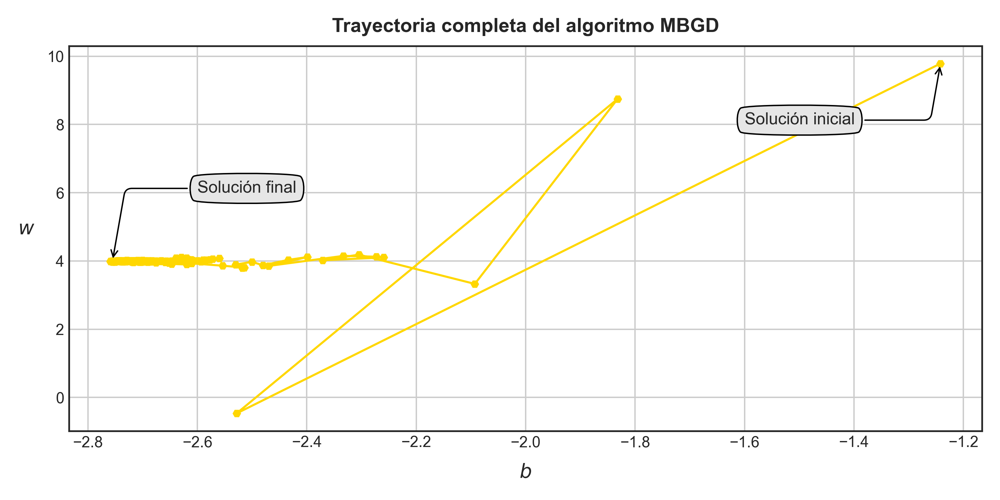

In [55]:
# Construimos el espacio de parámetros completo.
param_space_mbgd = np.vstack(
    [
        [path_mbgd[k][0][0] for k in range(0, len(path_mbgd))], 
        [path_mbgd[k][1][0] for k in range(0, len(path_mbgd))],
    ]
).T
# Graficamos la trayectoria del algoritmo en este espacio.
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(param_space_mbgd[:, 0], param_space_mbgd[:, 1], marker="H", markersize=5, color="gold")
ax.annotate(
    "Solución inicial", xy=(param_space_mbgd[0, 0], param_space_mbgd[0, 1]), xytext=(-1.6, 8.0),
    xycoords='data', fontsize=12, bbox=dict(boxstyle="round4,pad=.5", fc="0.9", color="black"),
    arrowprops=dict(
        arrowstyle="->", connectionstyle="angle,angleA=0,angleB=80,rad=20", color="black",
    ),
)
ax.annotate(
    "Solución final", xy=(param_space_mbgd[-1, 0], param_space_mbgd[-1, 1]), xytext=(-2.6, 6.0),
    xycoords='data', fontsize=12, bbox=dict(boxstyle="round4,pad=.5", fc="0.9", color="black"),
    arrowprops=dict(
        arrowstyle="->", connectionstyle="angle,angleA=0,angleB=80,rad=20", color="black",
    ),
)
ax.set_xlabel(r"$b$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$w$", fontsize=14, labelpad=15, rotation=0)
ax.grid(True)
ax.set_title("Trayectoria completa del algoritmo MBGD", fontsize=14, fontweight="bold", pad=10)
plt.tight_layout();

Podemos observar que la trayectoria que toma el algoritmo MBGD está lejos de ser tan caótica que la recorrida por el algoritmo SGD para llegar a la solución óptima de este problema. Esta mayor regularidad puede apreciarse más fácilmente al comparar las trayectorias de todas las variantes del algoritmo GD en el mismo gráfico:

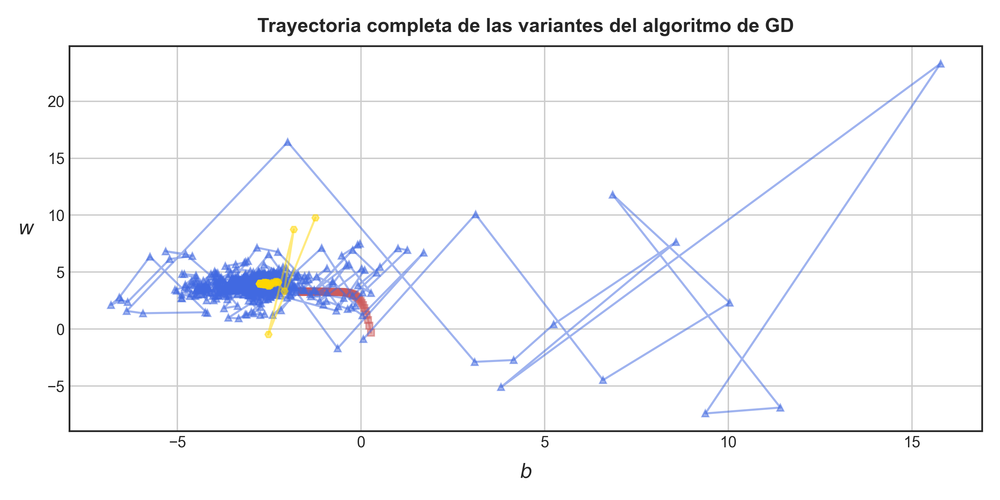

In [56]:
# Comparamos las trayectorias de todas las variantes del algoritmo de gradiente descendente.
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(param_space_bgd[:, 0], param_space_bgd[:, 1], marker="s", markersize=5, color="indianred", alpha=0.5)
ax.plot(param_space_sgd[:, 0], param_space_sgd[:, 1], marker="^", markersize=5, color="royalblue", alpha=0.5)
ax.plot(param_space_mbgd[:, 0], param_space_mbgd[:, 1], marker="H", markersize=5, color="gold", alpha=0.5)
ax.set_xlabel(r"$b$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$w$", fontsize=14, labelpad=15, rotation=0)
ax.grid(True)
ax.set_title("Trayectoria completa de las variantes del algoritmo de GD", fontsize=14, fontweight="bold", pad=10)
plt.tight_layout();

◼︎

A fin de resumir lo que hemos aprendido de las distintas variantes del algoritmo de gradiente descendente, dejaremos un cuadro comparativo.

<p style="text-align: center;">Tabla (4.1): Cuadro comparativo entre distintas variantes del algoritmo de gradiente descendente</p>

| Variante del algoritmo | Descripción | Complejidad temporal | Ventajas | Desventajas |
| :--------------------- | :---------- | :------------------- | :------- | :---------- |
| Gradiente descendente por lotes (BGD) | Variante que hace uso del conjunto de entrenamiento completo para calcular el gradiente de la función de costo y actualizar los parámetros de la regresión en cada iteración. | $O(mn)$ | Convergencia garantizada. | Alto tiempo de ejecución a medida que el conjunto de entrenamiento escala en tamaño. |
| Gradiente descendente estocástico (BSD) | Variante que hace uso de instancias aleatorias para calcular el gradiente de la función de costo y actualizar los parámetros de la regresión en cada iteración. | $O(n)$ | Rápido y eficiente en grandes conjuntos de datos. | Altos niveles de oscilación en un entorno de la solución óptima, con debilidades variables frente a la existencia de mínimos locales cuando la función de costo a utilizar no es convexa. |
| Gradiente descendente por mini-lotes (MBGD) | Variante que hace uso de muestras reducidas de instancias de entrenamiento para calcular el gradiente de la función de costo y actualizar los parámetros de la regresión en cada iteración. | $O(bn)$ | Menos ruidoso que la variante completamente estocástica, más eficiente que la variante BGD. | Añade un hiperparámetro adicional al procedimiento iterativo, correspondiente al tamaño de cada mini-lote. |

En la Tabla (4.1), $m$ es el número de instancias del conjunto de entrenamiento, $n$ es el número de variables independientes y $b$ es el tamaño del mini-lote, relativo a la variante MBGD del algoritmo.

#### Implementaciones del modelo de regresión lineal en <font color='mediumorchid'>Scikit-Learn</font> (Parte I).
Las implementaciones caseras construidas con anteriores tenían como objetivo poner a prueba nuestro entendimiento de las bases más elementales de la resolución de modelos de regresión lineal, ya sea por medio de la estimación por mínimos cuadrados o por soluciones numéricas como el algoritmo de gradiente descendente y sus variantes. Por supuesto, esto no quiere decir que nor abordaremos en detalle las implementaciones que nos provee la librería **<font color='mediumorchid'>Scikit-Learn</font>**. 

La construcción de implementaciones *from scratch* se antoja incluso como necesaria a la hora de abordar implementaciones más sofisticadas como las provistas por **<font color='mediumorchid'>Scikit-Learn</font>**, fundamentalmente porque nos permite entender de mejor manera la cantidad disponible de hiperparámetros que podemos *ajustar* en cada caso, tomando mejores decisiones a la hora de entender qué aplicar y qué no desde nuestra caja de herramientas más *oficial*.

Como antes, revisaremos cada implementación por medio de ejemplos.

**Ejemplo 4.6 – Mínimos cuadrados**: La implementación *oficial* provista por **<font color='mediumorchid'>Scikit-Learn</font>** para el modelo de regresión lineal viene dada por la clase `LinearRegression`, cuya dependencia es el módulo `sklearn.linear_model`. Esta clase nos permitirá resolver cualquier problema de regresión lineal por medio de una estimación por mínimos cuadrados.

Esta clase viene equipada con varios parámetros, entre los cuales tenemos:

- `fit_intercept`: Parámetro booleano que nos permite definir si el modelo que deseamos construir llevará consigo un parámetro de sesgo o no. Cuando `fit_intercept=False`, se espera que el conjunto de entrenamiento esté estadísticamente centrado. Es decir, que cada una de las variables independientes que lo constituyen tenga una media nula (sin cambiar su dispersion).
- `positive`: Parámetro booleano que fuerza a que los parámetros estimados para la regresión sean todos positivos. Esto puede resultar útil cuando sabemos que la variable de respuesta que queremos estimar debe ser siempre positiva. Esta opción estará disponible siempre que la matriz de diseño `X` no sea dispersa. Es decir, que la mayoría de sus entradas no sean nulas.

Asimismo, la clase `LinearRegression` viene equipada con varios atributos, asumiendo que la matriz de diseño y el vector de valores observados son designados como `X` e `y`, respectivamente:

- `intercept_`: Valor estimado para el parámetro de sesgo del modelo de regresión.
- `coef_`: Valores estimados para los parámetros del modelo de regresión. Este resultado se retorna en la forma de un arreglo de **<font color='mediumorchid'>Numpy</font>**.
- `singular_`: Valores singulares calculados para la matriz `X`, en formato de arreglo de **<font color='mediumorchid'>Numpy</font>**.
- `rank_`: Rango de la matriz `X`.

Como ocurre con todos los modelos de **<font color='mediumorchid'>Scikit-Learn</font>**, una vez definidos los conjuntos de entrenamiento y de prueba, usaremos el método `fit()` para entrenar nuestro modelo y `predict()` para predecir valores usando el modelo propiamente tal. En el caso del método `fit()`, podremos además utilizar el parámetro `sample_weight` para introducir **ponderaciones** para cada una de las instancias que constituyen el conjunto de entrenamiento, lo que nos permite introducir ciertos sesgos y/o conocimiento *a priori* a nuestro modelo.

En este ejemplo, generaremos un conjunto de datos con ruido a partir de la expresión $y=2+3x_{1}-x_{2}+4x_{3}$:

In [57]:
from sklearn.linear_model import LinearRegression

In [58]:
# Creamos un conjunto de datos con tres variables independientes.
X = rng.normal(loc=0, scale=1, size=(1000, 3))
y = 2 + 3 * X[:, 0] - X[:, 1] + 4 * X[:, 2] + rng.normal(loc=0, scale=2, size=1000)

Con lo datos ya generados, construimos nuestro modelo:

In [59]:
# Instanciamos nuestro modelo.
lstq_model = LinearRegression()

In [60]:
# Y lo entrenamos.
lstq_model.fit(X, y)

LinearRegression()

Con el modelo ya construido, mostramos en pantalla los parámetros estimados por la regresión:

In [61]:
# Imprimimos los resultados del modelo en pantalla.
print("==================================================")
print("Parámetros estimados por el modelo de regresión:")
print(f"b = {round(lstq_model.intercept_, 3)}")
print(f"w1 = {lstq_model.coef_.round(3)[0]}")
print(f"w2 = {lstq_model.coef_.round(3)[1]}")
print(f"w3 = {lstq_model.coef_.round(3)[2]}")
print("==================================================")
print("Valores singulares de la matriz de diseño:")
print(f"s1 = {lstq_model.singular_.round(3)[0]}")
print(f"s2 = {lstq_model.singular_.round(3)[1]}")
print(f"s3 = {lstq_model.singular_.round(3)[2]}")
print("==================================================")
print(f"Rango de la matriz de diseño = {lstq_model.rank_}")
print("==================================================")

Parámetros estimados por el modelo de regresión:
b = 1.997
w1 = 3.003
w2 = -0.999
w3 = 4.108
Valores singulares de la matriz de diseño:
s1 = 32.579
s2 = 32.253
s3 = 30.783
Rango de la matriz de diseño = 3


Podemos ver que la construcción de un modelo de regresión lineal con base en un ajuste por mínimos cuadrados en **<font color='mediumorchid'>Scikit-Learn</font>** es más bien directa, ya que es un procedimiento que puede resolverse en sólo unas cuantas líneas de código con resultados más que razonables. Tal y como en las implementaciones que construimos desde cero, no existen muchos hiperparámetros que podamos *ajustar* y que permitan explorar muchas más alternativas de modelos, ya que sólo podremos decidir si los coeficientes de la regresión serán (o no) positivos, o bien, si exisitirá (o no) un parámetro de sesgo.
◼︎

Como veremos en el siguiente ejemplo, los procedimientos iterativos que dependen del algoritmo de gradiente descedente (y sus variantes) permiten un mayor *juego de piernas* en términos de la cantidad de hiperparámetros disponibles que podemos ajustar, pero en realidad la diferencia que obtengamos con respecto al ajuste por mínimos cuadrados no será demasiado significativa más allá del tiempo de ejecución, ya que este procedimiento tiene una convergencia garantizada debido a que la solución del mismo (por medio de la ecuación normal (4.12)) es algebraicamente cerrada.

**Ejemplo 4.7 – Gradiente descendente estocástico:** La implementación del modelo de regresión lineal por medio del algoritmo de gradiente descendente estocástico (SGD) en **<font color='mediumorchid'>Scikit-Learn</font>** se realiza por medio de la clase `SGDRegressor`, la cual viene equipada con varios parámetros, entre los cuales consideramos:

- `loss`: Nos permite definir la función de costo respecto del cual se construye la regresión. Por defecto, el valor de este hiperparámetro es `loss="squared_error"`, lo que implica que la clase implementará el algoritmo de gradiente descendente para solucionar numéricamente un ajuste por mínimos cuadrados. Naturalmente, existen más alternativas, pero producirán soluciones numéricas para otros algoritmos de aprendizaje que, por el momento, no son parte de nuestro alcance.
- `fit_intercept`: Como en el caso de `LinearRegression`, este hiperparámetro nos permite definir si nuestro modelo incorparará o no un parámetro de sesgo. En el caso de que `fit_intercept=False`, **<font color='mediumorchid'>Scikit-Learn</font>** esperará que los datos de entrada estén centrados con respecto a la media.
- `max_iter`: Número máximo de iteraciones que serán implementadas en el algoritmo de gradiente descendente. Por defecto, este valor es igual a `1000`.
- `tol`: Tolerancia del algoritmo, la que se define como la mínima diferencia entre parámetros en iteraciones sucesivas. Si $L_{k}$ define el valor de la función de costo en la $k$-ésima iteración y $\mathrm{tol}$ el parámetro de tolerancia del algoritmo, entonces el procedimiento se detendrá antes de llegar al número máximo de iteraciones (`max_iter`) si $L_{k+1}-L_{k}<\mathrm{tol}$. Tal procedimiento de detención es conocido en las ciencias computacionales como **early stopping**.
- `learning_rate`: Corresponde al setting del programa de aprendizaje del algoritmo de gradiente descendente. Por defecto, su valor es `invscaling`, el cual implementa un programa con tasa $\gamma$ variable definida por la fórmula $\gamma(k)= \gamma_{0}/k^{t}$, donde $k$ es la correspondiente iteración, $t$ es un hiperparámetro a definir y $\gamma_{0}$ es la tasa de aprendizaje inicial (en la primera iteración), y que se fija por medio del hiperparámetro `eta0`. Otras alternativas incluyen:
    - `constant`, donde el programa es completamente estático; es decir, se usa la misma tasa de aprendizaje durante toda la progresión del algoritmo (que fijamos por medio del hiperparámetro `eta0`).
    - `optimal`, donde el programa es del tipo $\gamma =1/\alpha \left( k+k_{0} \right)$, siendo $\alpha$ y $k_{0}$ son hiperparámetros que se definen por medio de una [heurística propuesta por Leon Bottou en su paper de 2010](https://leon.bottou.org/publications/pdf/compstat-2010.pdf).
    - `adaptive`, donde el programa será estático (con tasa de aprendizaje `eta0`) siempre que el valor de la función de costo sea decreciente en iteraciones sucesivas. En caso de no ser así, la tasa de aprendizaje será dividida siempre por `5`, hasta que el algoritmo de grandiente descendente converja o se den las condiciones establecidas para su detención (por ejemplo, conforme un procedimiento de early stopping).
- `eta0`: La tasa de aprendizaje inicial del algoritmo, conforme el programa de aprendizaje establecido pero medio del hiperparámetro `learning_rate`.
- `power_t`: Corresponde al valor del hiperparámetro $t$ cuando `learning_rate="invscaling"`.
- `early_stopping`: Parámetro booleano que permite definir si se implementa o no un procedimiento de early stopping en nuestro algoritmo. Si definimos `early_stopping=True`, el algoritmo se detendrá cuando la tolerancia del mismo (`tol`) no se supere en un número determinado de iteraciones consecutivas, llamado **paciencia** del algoritmo, y definido por medio del hiperparámetro `n_iter_no_change` (cuyo valor por defecto es `5`). Por defecto, **<font color='mediumorchid'>Scikit-Learn</font>** no aplicará un procedimiento de early stopping.
- `warm_start`: Parámetro booleano que permite al algoritmo reutilizar la solución para el problema de regresión que hayamos estimado previamente por medio del método `fit()`. Por defecto, su valor es `False`, lo que implicará que las soluciones estimadas por medio del método `fit()` siempre se eliminarán cuando entrenemos nuevamente nuestro modelo.

De la misma forma que en el caso de la clase `LinearRegressor`, la clase `SGDRegressor` viene equipada con varios atributos:

- `intercept_`: Valor estimado para el parámetro de sesgo del modelo de regresión. Se trata de un arreglo de **<font color='mediumorchid'>Numpy</font>** de dimensión `(1,)`.
- `coef_`: Valores estimados para los parámetros del modelo de regresión. Este resultado se retorna en la forma de un arreglo de **<font color='mediumorchid'>Numpy</font>** de dimensión `(n_features)`, donde `n_features` es el número de variables independientes en nuestro conjunto de entrenamiento.

Para el entrenamiento de un modelo de regresión por medio de la clase `SGDRegressor`, procederemos como siempre haciendo uso del método `fit()`, definiendo pesos para determinadas instancias de entrenamiento si es necesario mediante el parámetro `sample_weight` (donde, por defecto, todas las instancias tienen el mismo peso, igual a `1`). Usaremos `predict()` para obtener predicciones cuando sea necesario.

Vamos a resolver el mismo problema de regresión que en el ejemplo anterior, a fin de comparar resultados. Recordemos que el conjunto de datos utilizado fue generado por medio de la expresión $y=2+3x_{1}-x_{2}+4x_{3}$, donde añadimos ruido Gaussiano sobre $y$ a fin de dificultar un poco la estimación de los correspondientes parámetros de la regresión. Implementaremos el algoritmo de gradiente descendente estocástico con un programa de aprendizaje con progresión inversa, con early stopping, tolerancia de `1e-4`, un máximo de `1500` iteraciones, paciencia de `4` iteraciones y una tasa de aprendizaje inicial de `0.01`:

In [62]:
from sklearn.linear_model import SGDRegressor

In [63]:
# Instanciamos nuestro modelo.
sgd_model = SGDRegressor(
    early_stopping=True,
    n_iter_no_change=4,
    tol=1e-4,
    eta0=0.01,
    learning_rate="invscaling",
    max_iter=1500,
)

In [64]:
# Y lo entrenamos.
sgd_model.fit(X, y)

SGDRegressor(early_stopping=True, max_iter=1500, n_iter_no_change=4, tol=0.0001)

Con el modelo ya entrenado, ahora fijamos nuestra atención en los parámetros estimados:

In [65]:
# Imprimimos los resultados del modelo en pantalla.
print("==================================================")
print("Parámetros estimados por el modelo de regresión:")
print(f"b = {sgd_model.intercept_.round(3)[0]}")
print(f"w1 = {sgd_model.coef_.round(3)[0]}")
print(f"w2 = {sgd_model.coef_.round(3)[1]}")
print(f"w3 = {sgd_model.coef_.round(3)[2]}")
print("==================================================")

Parámetros estimados por el modelo de regresión:
b = 2.036
w1 = 3.011
w2 = -1.02
w3 = 4.09


Podemos observar que la aplicación del algoritmo SGD permite obtener resultados no muy diferentes a los que obtuvimos previamente con el ajuste directo por mínimos cuadrados, y se acercan bastante a los valores *generadores* del conjunto de datos utilizado. Notemos además que esto último es un lujo que, en el mundo real, no nos podremos dar. No será común que *sepamos* los valores reales de los parámetros que deseamos estimar.

Llama la atención, por supuesto, la enorme cantidad de hiperparámetros que la clase `SGDRegressor` nos permite ajustar, lo que permite nos permite formular la siguiente (importante) pregunta: ***¿Cuál es la mejor combinación de hiperparámetros que resulta en el modelo con menor costo, de entre todas las posibles opciones?*** Esta no es una pregunta *al voleo*, y constituye el pilar fundamental una de las áreas más interesantes del aprendizaje automático: La **optimización (o ajuste) de hiperparámetros**. Este es un tópico que desarrollaremos en detalle más adelante, pero al cual le echaremos un vistazo en un ejemplo posterior. ◼︎

No existen implementaciones directas de las variantes BGD y MBGD del algoritmo de gradiente descendente en **<font color='mediumorchid'>Scikit-Learn</font>**, aunque sí es posible generar ciertos arreglos, a nivel programático, que permitan implementaciones sencillas. En cualquier caso, la clase `SGDRegressor` es tremendamente fiable en lo que respecta a la construcción de modelos de regresión lineal, y nos será posible resolver una enorme cantidad de problemas. Desde una perspectiva incremental, esto es tremendamente positivo, ya que poco a poco estamos poblando nuestra caja de herramientas.

### Estimación por máxima verosimilitud.
La estimación por mínimos cuadrados es una técnica sencilla que, para un problema de regresión lineal, ofrece soluciones exactas. Valiéndonos del algoritmo de gradiente descendente (y sus correspondientes variantes), podemos construir aproximaciones de gran calidad que serán útiles para cuando los problemas de interés crezcan tanto en número de instancias como en número de variables independientes. La derivación de soluciones numéricas para el problema de ajuste por mínimos cuadrados pone de manifiesto algunas limitaciones estrechamente relacionadas a los supuestos que tomamos antes de proceder con esta técnica. Por ejemplo:

- **Respecto a los errores del modelo:** La estimación por mínimos cuadrados asume que los errores del modelo están normalmente distribuidos sólo para hacer inferencias estadísticas (como pruebas de hipótesis y construcción de intervalos de confianza), aunque dicho supuesto no es estrictamente necesario para realizar la estimación de los coeficientes de regresión per se. Sin embargo, si los errores no están normalmente distribuidos, las estimaciones seguirán siendo insesgadas y consistentes, pero no necesariamente eficientes.
- **Respecto a la eficiencia y robustez:** La estimación por mínimos cuadrados puede no ser eficiente si los errores no siguen una distribución normal, es decir, otras estimaciones podrían tener una varianza menor. Además, el método es particularmente sensible a los valores atípicos (*outliers*) debido a que la función de costo (el error cuadrático medio) representa una distancia al cuadrado (penalizando enormemente tales valores), lo que puede afectar significativamente la estimación de los coeficientes, aunque ésto puede resolverse parcialmente mediante la introducción de un proceso previo de escalamiento (por ejemplo, normalización).
- **Respecto la flexibilidad:** La estimación por mínimos cuadrados está limitada a minimizar el error cuadrático medio de las estimaciones que realiza el modelo, lo cual es óptimo solo bajo ciertas condiciones estadísticas, como errores normalmente distribuidos e independientes con varianza constante, a fin de no sufrir de ciertos problemas en la estimación de los coeficientes de regresión.

A fin de añadir una alternativa mejorada a nuestra caja de herramientas para el caso de los modelos de regresión lineal, presentaremos un método de estimación que permite sacar ventaja de las limitaciones comentadas previamente, y que se conoce como **estimación por máxima verosimilitud**. Se trata de un método cuyo alcance es mucho más general que la estimación por mínimos cuadrados, ya que su objetivo es **estimar los parámetros de una distribución de probabilidad previamente asumida**, dado un conjunto de datos observados que suponemos que pueden modelarse conforme dicha distribución. En la práctica, ésto puede lograrse por medio de la **maximización** de una función que representa dicha distribución (o la familia a la que ésta pertenece) –llamada **función de verosimilitud**–, de manera tal que la probabilidad de que los datos observados pertenezcan a la distribución supuesta, conforme el modelo escogido, es la mayor posible.

#### Formulación.
Consideremos un conjunto de entrenamiento $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right)  :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R} \right\}$, donde $\mathbf{x}_{i}\in \mathbb{R}^{n}$ representa una fila o instancia $i$-ésima de la matriz de datos de entrada $\mathbf{X}$, siendo $m$ el total de instancias de $\mathcal{D}$. Asumiremos que los valores que componen $\mathbf{y}$ han sido generados por una función $f:\mathcal{I} \subseteq \mathbb{R}^{n} \longrightarrow \mathbb{R} $, tal que $\mathbf{y} =f\left( \mathbf{X} \right)  +\mathbf{\varepsilon } $, donde $\mathcal{I}$ es un dominio (abierto) de $\mathbb{R}^{n}$ que aglutina a todos los posibles valores que pueden tomar las variables independientes $\mathbf{x}_{j} ;\forall j=1,...,n$, denominado **espacio de entrada**, y $\mathbf{\varepsilon }$ representa el ruido asociado a los valores observados de $\mathbf{y}$. Debido a la presencia de este ruido, vamos a adoptar un enfoque probabilístico a fin de incorporar el efecto del mismo al modelo, haciendo uso para ello de una función de verosimilitud definida (simbólicamente) como

$$P\left( y_{i}|\mathbf{x}_{i} \right)  =\mathcal{N} \left( y_{i}|f\left( \mathbf{x}_{i} \right)  ,\sigma^{2} \right)$$
<p style="text-align: right;">$(4.19)$</p>

Donde $\mathcal{N}$ representa una distribución Gaussiana, siendo $i=,1...,m$. Como hemos asumido previamente una relación funcional del tipo $\mathbf{y} =f\left( \mathbf{X} \right)  +\mathbf{\varepsilon } $, supondremos que $\mathbf{\varepsilon }$ será una variable aleatoria Gaussiana con media nula y varianza $\sigma^{2}$, idéntica e independientemente distribuida, comúnmente asociada a ruido producido por errores de medición u observación. Naturalmente, nuestro objetivo será encontrar una función *"similar"* a la función generadora $f$, que es **desconocida**, y que además generalice adecuadamente lo aprendido a partir de $\mathcal{D}$ para cualquier otro conjunto de datos.

En un contexto más bien general, es común enfocarnos en la búsqueda de **modelos paramétricos**. Es decir, seleccionamos una función definida a partir de un conjunto de parámetros $w_{0},w_{1},...,w_{n}$ que agrupamos en un vector $\mathbf{w}\in \mathbb{R}^{n+1}$, de manera tal que exista un vector óptimo $\mathbf{w}^{\ast}$ que cumpla con *"modelar bien"* los datos del problema de interés. Por el momento, asumiremos que la varianza $\sigma^{2}$ es **conocida**, preocupándonos únicamente de *aprender* los valores que constituyen el vector $\mathbf{w}$. Para el caso del modelo de regresión lineal, la relación que construimos entre $\mathbf{w}$ y una instancia arbitraria $\mathbf{x}_{i}$ es de tipo lineal, por lo que podemos reescribir la ecuación (4.17) como

$$\begin{array}{lrcl}&P\left( y_{i}|\mathbf{x}_{i} \right)  &=&\mathcal{N} \left( y_{i}|\mathbf{x}^{\top }_{i} \mathbf{w} ,\sigma^{2} \right)  \\ \Longleftrightarrow &y_i=\mathbf{x}^{\top }_{i} \mathbf{w} +\varepsilon_{i} &\wedge &\mathbf{\varepsilon } =\left( \varepsilon_{1} ,...,\varepsilon_{m} \right)  \sim \mathcal{N} \left( 0,\sigma^{2} \right)  \end{array} $$
<p style="text-align: right;">$(4.20)$</p>

En la ecuación anterior, como antes, hemos *acondicionado* a cada instancia $\mathbf{x}_{i}$ para ser compatible con la multiplicación matricial con el vector $\mathbf{w}$, añadiendo para ello un $1$ en la primera posición de cada una. La clase de funciones que describe la segunda línea de la expresión (4.20) son, naturalmente, rectas que pasan por el punto $(0,w_{0})$. Por lo tanto, hemos escogido una **parametrización** del tipo $f\left( \mathbf{x}_{i} \right)  =\mathbf{x}^{\top }_{i} \mathbf{w} $.

El **valor de verosimilitud** en la primera expresión de (4.20) corresponde a la función de densidad de probabilidad de $y_{i}$ evaluada en la parametrización $\mathbf{x}_{i}^{\top}\mathbf{w}$. Notemos que la única **fuente de incertidumbre** en este caso proviene del ruido asociado a las observaciones, porque hemos asumido que $\mathbf{w}$ y $\mathbf{x}_{i}$ ($i=1,...,m$) son conocidas en la primera ecuación de la expresión (4.21).

El modelo de regresión definido en la expresión (4.20) no solamente es lineal con respecto a los correspondientes parámetros, sino que también con respecto a las instancias $\mathbf{x}_{i}$, para $i=1,...,m$. Para cada combinación de $\mathbf{w}$ y $\mathbf{x}_{i}$, el modelo $f\left( \mathbf{x}_{i} \right)  =\mathbf{x}^{\top }_{i} \mathbf{w} +\mathbf{\varepsilon}$ describe una colección de hiperplanos en $\mathbb{R}^{n}$, para los cuales el vector de parámetros $\mathbf{w}$ representa la *pendiente* de cada uno de ellos y los correspondientes parámetros de sesgo.

#### Estimación de parámetros.
Sea el conjunto de entrenamiento $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right)  :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R} \right\}$, donde $\mathbf{x}_{i}\in \mathbb{R}^{n}$ representa una fila o instancia $i$-ésima de la matriz de datos de entrada $\mathbf{X}$, siendo $m$ el total de instancias de $\mathcal{D}$. Consideremos el mismo marco de referencia con el que hemos generado la expresión (4.20), para el cual las observaciones que componen $\mathbf{y}$ son independientes e idénticamente distribuidas (iid), dados los correspondientes valores de entrada que componen cada fila (instancia) de $\mathbf{X}$. Matemáticamente, ésto implica que

$$\begin{array}{lll}P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right)  &=&\displaystyle P\left( y_{1},...,y_{m}|\mathbf{x}_{1} ,...,\mathbf{x}_{m} ,\mathbf{w} \right)  \\ &=&\displaystyle P\left( y_{1}|\mathbf{x}_{1} ,\mathbf{w} \right)  P\left( y_{2}|\mathbf{x}_{2} ,\mathbf{w} \right)  \cdots P\left( y_{m}|\mathbf{x}_{m} ,\mathbf{w} \right)  \\ &=&\displaystyle \prod^{m}_{i=1} P\left( y_{i}|\mathbf{x}_{i} ,\mathbf{w} \right)  \\ &=&\displaystyle \prod^{m}_{i=1} \mathcal{N} \left( y_{i}|\mathbf{x}^{\top }_{i} \mathbf{w} ,\sigma^{2} \right)  \end{array} $$
<p style="text-align: right;">$(4.21)$</p>

Donde $\mathcal{X} :=\left\{ \mathbf{x}_{i} \right\}^{m}_{i=1}  \wedge \mathcal{Y} :=\left\{ y_{i}\right\}^{m}_{i=1}$ son los espacios que aglutinan a las instancias de entrenamiento y sus correspondientes observaciones resultantes. En la expresión anterior, se tiene que $P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right)$ es la **función de verosimilitud** de interés, la que resulta ser Gaussiana, al igual que los factores $P\left( y_{i}|\mathbf{x}_{i} ,\mathbf{w} \right)$ para todo $i=1,...,m$, debido a la presencia del ruido $\mathbf{\varepsilon}$, como se estableció en la ecuación (4.20).

Como en la estimación por mínimos cuadrados, estamos interesados en encontrar un vector óptimo $\mathbf{w}^{\ast}$ de parámetros, de manera que la ecuación funcional $y_i=\mathbf{x}^{\top }_{i} \mathbf{w}^{\ast} +\varepsilon_{i}$ **generalice** adecuadamente cualquier *aprendizaje* para todo $\mathbf{x}_{i}\in \mathbb{R}^{m}$. Una vez hallado $\mathbf{w}^{\ast}$, podemos predecir los valores de $y_i$ para todo $i=1,...,m$ haciendo uso de dicha ecuación funcional. De esta manera, para cualquier punto arbitrario *de prueba* $\mathbf{x}_{t}$ (en general, tal que $\mathbf{x}_{t}\notin \mathcal{D}$), la distribución del valor objetivo respectivo es

$$P\left( y_{t}|\mathbf{x}_{t} ,\mathbf{w}^{\ast } \right)  =\mathcal{N} \left( y_{t}|\mathbf{x}^{\top }_{t} \mathbf{w}^{\ast } ,\sigma^{2} \right)$$
<p style="text-align: right;">$(4.22)$</p>

En general, para estimar $\mathbf{w}^{\ast}$, procederemos por medio de la maximización de la función de verosimilitud $P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right)$. La razón de esto es debido a que maximizar $P$, intuitivamente, implica maximizar la distribución predictiva de los datos de entrenamiento dado un vector de parámetros $\mathbf{w}$. En otras palabras, determinamos el valor de $\mathbf{w}$ que hace más probable la *ocurrencia* de los datos observados (las $y_i$). Es decir, $\mathbf{w}^{\ast }$ es la solución del problema no restringido

$$\mathbf{w}^{\ast } =\underset{\mathbf{w} }{\mathrm{argmax} } \  P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right)$$
<p style="text-align: right;">$(4.23)$</p>

Denotamos por tanto a $\mathbf{w}^{\ast }$ como la **estimación máximo verosímil (MLE)** para $\mathbf{w}$.

A diferencia de la estimación por mínimos cuadrados, en general, la MLE no nos conduce a una solución algebraicamente cerrada, fundamentalmente porque el supuesto Gaussiano inherente a la distribución del ruido asociado a las observaciones de interés deriva en expresiones no lineales, lo que implica que siempre tendremos que recurrir a métodos numéricos de optimización para resolver el problema (4.23). No obstante, bajo ciertas condiciones, sí es posible desarrollar una solución cerrada.

Previo a resolver el problema (4.23), es buena idea considerar algunas manipulaciones algebraicas útiles para simplificarlo. En particular:

- Debido a que los algoritmos de optimización suelen trabajar sobre problemas de minimización, optaremos por considerar el problema complementario a (4.23). Es decir, $\mathbf{w}^{\ast } =\underset{\mathbf{w} }{-\mathrm{argmin} } \  P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right)$.
- Debido a que, conforme lo visto en la expresión (4.21), $P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right)  $ no es más que el resultado de multiplicaciones sucesivas de distribuciones Gaussianas, resulta adecuado aplicar una transformación logarítmica sobre $P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right)$, de manera que las correspondientes multiplicaciones de estas distribuciones se *transformen* en una suma de logaritmos aplicados sobre tales distribuciones. Esto es posible por que el logaritmo es una función monótona creciente, por lo que, para todo $\mathbf{u}\in \mathbb{R^{+}}^{n}$ arbitrario, se tendrá que los extremos globales de $\mathbf{u}$ coinciden con los de $\log(\mathbf{u})$.

De lo anterior, la función a optimizar es

$$\begin{array}{lll}-\log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right)  \right)  &=&\displaystyle -\log \left[ \prod^{m}_{i=1} P\left( y_{i}|\mathbf{x}_{i} ,\mathbf{w} \right)  \right]  \\ &=&\displaystyle -\sum^{m}_{i=1} \log \left( P\left( y_{i}|\mathbf{x}_{i} ,\mathbf{w} \right)  \right)  \end{array} $$
<p style="text-align: right;">$(4.24)$</p>

Como la función de verosimilitud se ha asumido Gaussiana, tenemos que

$$\begin{array}{lll}\log \left( P\left( y_{i}|\mathbf{x}_{i} ,\mathbf{w} \right)  \right)  &=&\displaystyle \log \left( \mathcal{N} \left( y_{i}|\mathbf{x}^{\top }_{i} \mathbf{w} ,\sigma^{2} \right)  \right)  \\ &=&\displaystyle \log \left( \frac{1}{\sigma \sqrt{2\pi } } e^{-\frac{1}{2} \left( \frac{y_{i}-\mathbf{x}^{\top }_{i} \mathbf{w} }{\sigma } \right)^{2}  }\right)  \\ &=&\displaystyle \log \left( \frac{1}{\sigma \sqrt{2\pi } } \right)  +\log \left( e^{-\frac{1}{2} \left( \frac{y_{i}-\mathbf{x}^{\top }_{i} \mathbf{w} }{\sigma } \right)^{2}  }\right)  \\ &=&\displaystyle -\frac{1}{2} \left( \frac{y_{i}-\mathbf{x}^{\top }_{i} \mathbf{w} }{\sigma } \right)^{2}  +\underbrace{\log \left( \frac{1}{\sigma \sqrt{2\pi } } \right)  }_{\mathrm{constante} } \\ &=&\displaystyle -\frac{1}{2\sigma^{2} } \left( y_{i}-\mathbf{x}^{\top }_{i} \mathbf{w} \right)^{2}  +C\end{array} $$
<p style="text-align: right;">$(4.25)$</p>

Donde $C$ aglutina únicamente a todos los términos constantes que son independientes de $\mathbf{w}$. Reemplazando la última ecuación de (4.25) en (4.24), e ignorando los términos constantes, obtenemos

$$\begin{array}{lll}-\log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right)  \right)  &:=&\displaystyle \frac{1}{2\sigma^{2} } \sum^{m}_{i=1} \left( y_{i}-\mathbf{x}^{\top }_{i} \mathbf{w} \right)^{2}  \\ &=&\displaystyle \frac{1}{2\sigma^{2} } \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)^{\top }  \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)  \\ &=&\displaystyle \frac{1}{2\sigma^{2} } \left\Vert \mathbf{y} -\mathbf{X} \mathbf{w} \right\Vert^{2}  \end{array} $$
<p style="text-align: right;">$(4.26)$</p>

Designaremos por $LL\left( \mathbf{w} \right)  $ al negativo del logaritmo de la función de verosimilitud (es decir, $LL\left( \mathbf{w} \right)  =-\log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right)  \right)  $). De esta forma, hemos obtenido una fórmula explícita que permite estimar el vector de parámetros óptimo $\mathbf{w}^{\ast}$ de manera directa, ya que podemos calcular rápidamente el gradiente de $LL(\mathbf{w})$ a fin de obtener los puntos en los cuales sus componentes anulan, y que constituyen los *candidatos* a solución del problema (4.23). De esta manera, calculando las correspondientes derivadas parciales, obtenemos

$$\begin{array}{lll}\nabla_{\mathbf{w} } LL\left( \mathbf{w} \right)  &=&\displaystyle \frac{\partial }{\partial \mathbf{w} } \left[ \frac{1}{2\sigma^{2} } \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)^{\top }  \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)  \right]  \\ &=&\displaystyle \frac{1}{2\sigma^{2} } \frac{\partial }{\partial \mathbf{w} } \left( \mathbf{y}^{\top } \mathbf{y} -2\mathbf{y}^{\top } \mathbf{X} \mathbf{w} +\mathbf{w}^{\top } \mathbf{X}^{\top } \mathbf{X} \mathbf{w} \right)  \\ &=&\displaystyle \frac{1}{2\sigma^{2} } \left( -2\mathbf{y}^{\top } \mathbf{X} +2\mathbf{w}^{\top } \mathbf{X}^{\top } \mathbf{X} \right)  \\ &&\displaystyle \frac{1}{\sigma^{2} } \left( -\mathbf{y}^{\top } \mathbf{X} +\mathbf{w}^{\top } \mathbf{X}^{\top } \mathbf{X} \right)  \end{array} $$
<p style="text-align: right;">$(4.27)$</p>

Como antes, buscamos los puntos críticos del gradiente $\nabla_{\mathbf{w} } LL\left( \mathbf{w} \right)$ anulando las correspondientes derivadas parciales para cada componente de $\mathbf{w}$. De esta manera tenemos que

$$\begin{array}{lll}\nabla_{\mathbf{w} } LL\left( \mathbf{w} \right)  =\mathbf{0}^{\top } &\Longleftrightarrow &\displaystyle \frac{1}{\sigma^{2} } \left( -\mathbf{y}^{\top } \mathbf{X} +\mathbf{w}^{\top } \mathbf{X}^{\top } \mathbf{X} \right)  =\mathbf{0}^{\top } \\ &\Longleftrightarrow &\mathbf{w}^{\top } \mathbf{X}^{\top } \mathbf{X} =\mathbf{y}^{\top } \mathbf{X} \\ &\Longleftrightarrow &\mathbf{w}^{\top } =\mathbf{y}^{\top } \mathbf{X} \left( \mathbf{X}^{\top } \mathbf{X} \right)^{-1}  \\ &\Longleftrightarrow &\mathbf{w}^{\ast} =\left( \mathbf{X}^{\top } \mathbf{X} \right)^{-1}  \mathbf{X}^{\top } \mathbf{y} \end{array} $$
<p style="text-align: right;">$(4.28)$</p>

Notemos que la solución cerrada provista por la última línea en la expresión (4.28) es equivalente a la estimación por mínimos cuadrados determinada en la ecuación (4.12) (la ecuación normal), siendo $\mathbf{w}^{\ast}$ por tanto el estimador de máxima verosimilitud para $\mathbf{w}$. De esta manera, hemos llegado a un importante resultado: **El estimador máximo verosímil para los parámetros de un modelo de regresión lineal es equivalente al correspondiente estimador por mínimos cuadrados, siempre que el ruido asociado a las observaciones de la variable sea independiente y esté normalmente distribuido**.

Debido a que $LL(\mathbf{w})$ es una función convexa, la condición $\nabla_{\mathbf{w} } LL\left( \mathbf{w} \right) =\mathbf{0}^{\top }$ es necesaria y suficiente para garantizar que los puntos críticos determinados previamente en efecto constituyen un mínimo global de $LL(\mathbf{w})$.

#### Extensión a problemas no lineales por medio de transformaciones.
La estimación por máxima verosimilitud no está disponible, de manera directa, en **<font color='mediumorchid'>Scikit-Learn</font>**, ya que los modelos de regresión lineal pueden construirse rápida y eficientemente en esta librería haciendo uso del método de mínimos cuadrados y del algoritmo de gradiente descendente estocástico. Además, el estimador máximo verosímil (para los parámetros de la regresión) es equivalente al estimador de mínimos cuadrados cuando el ruido $\varepsilon$ asociado a las observaciones de la variable de respuesta está constituido por valores independientes y normalmente distribuidos.

Sin embargo, hemos desarollado los fundamentos de la estimación de máxima verosimilitud porque buscamos mayor eficiencia y generalidad en los enfoques a desarrollar. Sobretodo cuando modelos *puramente lineales* dejan de ser suficientes para resolver un problema de interés. O, equivalentemente, cuando deseamos construir predictores cuyos recorridos en $\mathbb{R}^{n}$ requieran de geometrías más complejas que las de un hiperplano. Este será el caso en la gran mayoría de los problemas a los que nos enfrentaremos en el mundo real, y en muchos casos será necesario que tomemos una (muy buena) decisión en relación a la definición de la función de verosimilitud a implementar.

Debido a que el modelo de regresión lineal es (valga la redundancia) *lineal* con respecto a sus parámetros, y no con respecto al *predictor*, es posible introducir transformaciones sobre las variables independientes que constituyen el conjunto de entrenamiento de interés, donde tales transformaciones vienen representadas por funciones que hacen el papel de dichas variables, las que pueden combinarse linealmente con los parámetros a estimar para construir el valor de salida del problema (con el que intentamos estimar el valor de la variable de respuesta).

Formalizaremos lo anterior como sigue: Sea el conjunto de entrenamiento $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right)  :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R} \right\}$, donde $\mathbf{x}_{i}\in \mathbb{R}^{n}$ representa una fila o instancia $i$-ésima de la matriz de datos de entrada $\mathbf{X}$, siendo $m$ el total de instancias de $\mathcal{D}$. Asumimos que las observaciones que componen $\mathbf{y}$ son independientes e idénticamente distribuidas (iid), dados los correspondientes valores de entrada que componen cada fila (instancia) de $\mathbf{X}$, que designamos como $\mathbf{x}_{i}$, para $i=1,...,m$. Estamos interesados en construir un modelo de regresión lineal conforme la estructura

$$\begin{array}{ll}&P\left( y_{i}|\mathbf{x}_{i} \right) =\mathcal{N} \left( y_{i}|\mathbf{\phi}^{\top} \left( \mathbf{x}_{i} \right) \mathbf{w} ,\sigma^{2} \right)\\ \Longleftrightarrow&y_{i}=\mathbf{\phi}^{\top} \left( \mathbf{x}_{i} \right) \mathbf{w} +\mathbf{\varepsilon}\\ \Longleftrightarrow&\displaystyle y_{i}=\sum_{s=0}^{k-1} w_{s}\phi_{s} \left( \mathbf{x}_{i} \right) +\varepsilon_{i}\end{array}$$
<p style="text-align: right;">$(4.29)$</p>

Donde $\mathbf{\phi} :U\subseteq \mathbb{R}^{n} \longrightarrow V\subseteq \mathbb{R}^{k}$ es un campo vectorial no lineal que transforma cada una de las $m$ instancias de entrenamiento $\mathbf{x}_{1},...,\mathbf{x}_{m}$ en los $k$ **atributos** $\phi_{0} \left( \mathbf{x}_{i} \right) ,...,\phi_{k-1} \left( \mathbf{x}_{i} \right)$. La transformación $\mathbf{\phi}$ así definida se denomina **vector de atributos** del modelo. Los conjuntos $U$ y $V$ son espacios vectoriales que definen el cambio de dimensión generado por dicho vector, el cual comúnmente es tal que $k>n$. Incluso, en algunos casos (muy ingeniosos, como veremos más adelante), $V$ puede tener dimensión infinita. Notemos además que los parámetros del modelo de regresión *transformado*, digamos $w_{0},w_{1},...,w_{k-1}$, son lineales con respecto a los atributos.

Vamos a ilustrar los efectos de incorporar el vector de atributos $\mathbf{\phi}$ al implementar una estimación de máxima verosimilitud a fin de –valga la redundancia– estimar los parámetros $w_{0},w_{1},...,w_{k-1}$, aglutinados en el vector $\mathbf{w}\in \mathbb{R}^{k}$. Para el conjunto de entrenamiento $\mathcal{D}$, introducimos la **matriz de diseño** (conocida también como **matriz de atributos**) $\mathbf{\Phi}$, definida como

$$\mathbf{\Phi} :=\left( \begin{matrix}\mathbf{\phi}^{\top} \left( \mathbf{x}_{1} \right)\\ \mathbf{\phi}^{\top} \left( \mathbf{x}_{2} \right)\\ \vdots\\ \mathbf{\phi}^{\top} \left( \mathbf{x}_{m} \right)\end{matrix} \right) =\left( \begin{matrix}\phi_{0} \left( \mathbf{x}_{1} \right)&\phi_{1} \left( \mathbf{x}_{1} \right)&\cdots&\phi_{k-1} \left( \mathbf{x}_{1} \right)\\ \phi_{0} \left( \mathbf{x}_{2} \right)&\phi_{1} \left( \mathbf{x}_{2} \right)&\cdots&\phi_{k-1} \left( \mathbf{x}_{2} \right)\\ \vdots&\vdots&\ddots&\vdots\\ \phi_{0} \left( \mathbf{x}_{m} \right)&\phi_{1} \left( \mathbf{x}_{m} \right)&\cdots&\phi_{k-1} \left( \mathbf{x}_{m} \right)\end{matrix} \right) \in \mathbb{R}^{m\times k}$$
<p style="text-align: right;">$(4.30)$</p>

La matriz de diseño juega el mismo papel que la matriz de variables independientes $\mathbf{X}$. En efecto, el modelo de regresión *transformado* conforme la matriz de diseño $\mathbf{\Phi}$ toma ahora la forma $\mathbf{y} =\mathbf{\Phi} \mathbf{w}$. De esta manera, en la estimación de máxima versomilitud simplemente debemos reemplazar la matriz $\mathbf{X}$ por la matriz $\mathbf{\Phi}$, con lo cual

$$\begin{array}{lll}\log \left( P\left( \mathbf{y}|\mathbf{\Phi},\mathbf{w} \right) \right)&=&\displaystyle \log \left( \mathcal{N} \left( \mathbf{y}|\mathbf{\Phi} \mathbf{w} ,\sigma^{2} \right) \right)\\ &=&\displaystyle \log \left( \frac{1}{\sigma \sqrt{2\pi}} \exp \left( -\frac{1}{2\sigma^{2}} \left( \mathbf{y}-\mathbf{\Phi} \mathbf{w} \right)^{\top} \left( \mathbf{y}-\mathbf{\Phi} \mathbf{w} \right) \right) \right)\\ &=&\displaystyle \log \left( \frac{1}{\sigma \sqrt{2\pi}} \right) +\log \left( \exp \left( -\frac{1}{2\sigma^{2}} \left( \mathbf{y}-\mathbf{\Phi} \mathbf{w} \right)^{\top} \left( \mathbf{y}-\mathbf{\Phi} \mathbf{w} \right) \right) \right)\\ &=&\displaystyle -\frac{1}{2\sigma^{2}} \left( \mathbf{y}-\mathbf{\Phi} \mathbf{w} \right)^{\top} \left( \mathbf{y}-\mathbf{\Phi} \mathbf{w} \right) +\underbrace{\log \left( \frac{1}{\sigma \sqrt{2\pi}} \right)}_{\mathrm{constante} =C}\end{array}$$
<p style="text-align: right;">$(4.31)$</p>

Debido a que $\mathbf{X}$ y $\mathbf{\Phi}$ son independientes del vector $\mathbf{w}$ (en cada caso), es inmediato que el estimador máximo verosímil para este problema general es

$$\mathbf{w}^{\ast} =\left( \mathbf{\Phi}^{\top} \mathbf{\Phi} \right)^{-1} \mathbf{\Phi}^{\top} \mathbf{y}$$
<p style="text-align: right;">$(4.32)$</p>

Lo que resuelve el problema (4.29).

**Ejemplo 4.8 – Regresión polinomial:** Consideremos el conjunto de entrenamiento $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right)  :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R} \right\}$, donde $\mathbf{x}_{i}\in \mathbb{R}^{n}$ representa una fila o instancia $i$-ésima de la matriz de datos de entrada $\mathbf{X}$, siendo $m$ el total de instancias de $\mathcal{D}$. Asumimos que las observaciones que componen $\mathbf{y}$ son independientes e idénticamente distribuidas (iid), dados los correspondientes valores de entrada que componen cada fila (instancia) de $\mathbf{X}$, que designamos como $\mathbf{x}_{i}$, para $i=1,...,m$. Como cada instancia $\mathbf{x}_{i}$ del conjunto de entrenamiento $\mathcal{D}$ es un vector en $\mathbb{R}^{n+1}$, la formulación de un modelo lineal es del tipo $\mathbf{y} =\mathbf{X} \mathbf{w}$ (siempre que ignoremos el término de ruido e incorporemos el parámetro de sesgo al vector de parámetros $\mathbf{w}\in \mathbb{R}^{n}$).

Supongamos que *sabemos*, de alguna manera, que la correspondencia entre los pares $(\mathbf{x}_{i},y_{i})$ no es lineal (para $i=1,...,m$). Por lo tanto, el modelo $\mathbf{y} =\mathbf{X} \mathbf{w}$ es insuficiente para representar cualquier dependencia del tipo $\mathbf{y}=f(\mathbf{X})$. Una forma de considerar correspondencias más complejas es mediante la introducción de una **transformación polinómica** que, correspondientemente, incorpore potencias enteras hasta, digamos, $d$, de los elementos de $\mathbf{x}_{i}$. Es decir, queremos que, en vez de considerar únicamente los $n+1$ elementos de $\mathbf{x}_{i}=(1,x_{i1},...,x_{in})$ en el modelo, integremos además los siguientes valores:

- Las potencias enteras hasta de exponente $d$ de los elementos de $\mathbf{x}_{i}$. Es decir, $\mathbf{x}^{\left( d \right)} =\left( 1^{0},1^{1},...1^{d},x_{i1}^{0},x_{i1}^{1},...,x_{i1}^{d},...,x_{ij}^{0},x_{ij}^{1},...,x_{ij}^{d},...,x_{in}^{0},x_{in}^{1},...,x_{in}^{d} \right)$. Este caso se conoce como **transformación polinomial incompleta de grado $d$**.
- Las potencias enteras hasta de exponente $d$ de los elementos de $\mathbf{x}_{i}$, junto a todos los productos posibles de tales elementos, desde $2$ a $d$ términos involucrados en estas multiplicaciones. Este caso es más difícil de describir en términos generales, pero lo ejemplificaremos unas líneas más adelante, y se conoce como **transformación polinomial completa de grado $d$**. Los productos cruzados son llamados **interacciones** de la transformación, las que serán de grado $r$ (con $r\leq d$) cuando hay exactamente $r$ términos involucrados en dicho producto.

**CASO I – Transformación polinomial incompleta:** Nuestro objetivo entonces es añadir las potencias enteras de cada término individual de $\mathbf{x}_{i}$, hasta un exponente $d$. Por ejemplo, si $d=3$, entonces consideramos la matriz de diseño $\mathbf{\Phi}$, definida como

$$\mathbf{\Phi} \left( \mathbf{x}_{i} \right) =\left( \begin{matrix}1&x_{i1}&x_{i1}^{2}&x_{i1}^{3}\\ 1&x_{i2}&x_{i2}^{2}&x_{i2}^{3}\\ \vdots&\vdots&\vdots&\vdots\\ 1&x_{in}&x_{in}^{2}&x_{in}^{3}\end{matrix} \right) \in \mathbb{R}^{m\times 4}$$
<p style="text-align: right;">$(4.33)$</p>

En efecto, notemos que

$$\begin{array}{lll}\mathbf{\Phi} \left( \mathbf{x}_{i} \right) \mathbf{w}&=&\displaystyle \left( \begin{matrix}1&x_{i1}&x_{i1}^{2}&x_{i1}^{3}\\ 1&x_{i2}&x_{i2}^{2}&x_{i2}^{3}\\ \vdots&\vdots&\vdots&\vdots\\ 1&x_{in}&x_{in}^{2}&x_{in}^{3}\end{matrix} \right) \left( \begin{matrix}w_{0}\\ w_{1}\\ w_{2}\\ w_{3}\end{matrix} \right)\\ &=&\displaystyle \left( \begin{matrix}w_{0}+w_{1}x_{i1}+w_{2}x_{i1}^{2}+w_{3}x_{i1}^{3}\\ w_{0}+w_{1}x_{i2}+w_{2}x_{i2}^{2}+w_{3}x_{i2}^{3}\\ \cdots\\ w_{0}+w_{1}x_{in}+w_{2}x_{in}^{2}+w_{3}x_{in}^{3}\end{matrix} \right)\\ &=&\displaystyle \left( \begin{matrix}\sum\nolimits_{s=0}^{3} w_{s}x_{i1}^{s}\\ \sum\nolimits_{s=0}^{3} w_{s}x_{i2}^{s}\\ \cdots\\ \sum\nolimits_{s=0}^{3} w_{s}x_{in}^{s}\end{matrix} \right)\end{array}$$
<p style="text-align: right;">$(4.34)$</p>

Por lo tanto, esta transformación polinómica simplemente intercambia cada variable original $x_{ij}$ de la instancia $\mathbf{x}_{i}$ ($i=1,...,m\wedge j=1,...,n$) por las $4n$ variables $x_{ij}^{s}$, para $j=1,...,n\wedge s=0,1,2,3$. Este modelo sigue siendo lineal, porque las potencias $x_{ij}^{s}$ para $s>1$ son tratadas como variables *independientes* adicionales, todas ellas escaladas por los correspondientes parámetros de la regresión (que deseamos estimar).

Un efecto importante de la transformación anterior es que genera un escalamiento muy grande del número de variables independientes de nuestro modelo original.

**CASO 2 – Trasformación polinomial completa:** Vamos a ejemplificar este caso para $n=3$ y $d=3$, y consideremos $i=1,...,m$. La matriz original que aglutina los datos de entrada del problema es la siguiente

$$\mathbf{X} =\left( \begin{matrix}x_{11}&x_{12}&x_{13}\\ x_{21}&x_{22}&x_{23}\\ \vdots&\vdots&\vdots\\ x_{m1}&x_{m2}&x_{m3}\end{matrix} \right) \in \mathbb{R}^{m\times 3}$$
<p style="text-align: right;">$(4.35)$</p>

En este caso, el modelo de regresión lineal puede descomponerse como

$$\left( \begin{matrix}y_{1}\\ y_{2}\\ \vdots\\ y_{m}\end{matrix} \right) =\left( \begin{matrix}x_{11}&x_{12}&x_{13}\\ x_{21}&x_{22}&x_{23}\\ \vdots&\vdots&\vdots\\ x_{m1}&x_{m2}&x_{m3}\end{matrix} \right) \left( w_{1},w_{2},w_{3} \right)$$
<p style="text-align: right;">$(4.36)$</p>

Una transformación completa, además de considerar las potencias enteras de los términos de la instancia $\mathbf{x}_{i}=(x_{i1},x_{i2})$ (es decir, $x_{i1}^{s}\wedge x_{i2}^{s}$, para $s=0,1,2,3$), considera además las **interacciones cruzadas**, que en este caso son:

- Cuadráticas: $x_{i1}x_{i2},x_{i1}x_{i3},x_{i2}x_{i3}$.
- Cúbicas: $x_{i1}^{2}x_{i2},x_{i1}x_{i2}^{2},x_{i1}^{2}x_{i3},x_{i1}x_{i3}^{2},x_{i2}^{2}x_{i3},x_{i2}x_{i3}^{2},x_{i1}x_{i2}x_{i3}$.

Notemos que la progresión en el número de términos considerando estas interacciones escala en una progresión combinatorial. Para este caso, la matriz de diseño toma la forma

$$\mathbf{\Phi}(\mathbf{x}_{i}) =\left( \underbrace{\begin{matrix}1&x_{11}&x_{12}&x_{13}\\ 1&x_{21}&x_{22}&x_{23}\\ \vdots&\vdots&\vdots&\vdots\\ 1&x_{m1}&x_{m2}&x_{m3}\end{matrix}}_{\mathrm{parte\  lineal}} \  \  \underbrace{\begin{matrix}x_{11}^{2}&x_{12}^{2}&x_{13}^{2}&x_{11}x_{12}&x_{11}x_{13}&x_{12}x_{13}\\ x_{21}^{2}&x_{22}^{2}&x_{23}^{2}&x_{21}x_{22}&x_{21}x_{23}&x_{22}x_{23}\\ \vdots&\vdots&\vdots&\vdots&\vdots&\vdots\\ x_{m1}^{2}&x_{m2}^{2}&x_{m3}^{2}&x_{m1}x_{m2}&x_{m1}x_{m3}&x_{m2}x_{m3}\end{matrix}}_{\mathrm{parte\  cuadratica}} \  \  \underbrace{\begin{matrix}x_{11}^{3}&x_{12}^{3}&x_{13}^{3}&x_{11}^{2}x_{12}&x_{11}^{2}x_{13}&x_{11}x_{12}^{2}&x_{11}x_{13}^{2}&x_{12}^{2}x_{13}&x_{12}x_{13}^{2}&x_{11}x_{12}x_{13}\\ x_{21}^{3}&x_{22}^{3}&x_{23}^{3}&x_{21}^{2}x_{22}&x_{21}^{2}x_{23}&x_{21}x_{22}^{2}&x_{21}x_{23}^{2}&x_{22}^{2}x_{23}&x_{22}x_{23}^{2}&x_{21}x_{22}x_{23}\\ \vdots&\vdots&\vdots&\vdots&\vdots&\vdots&\vdots&\vdots&\vdots&\vdots\\ x_{m1}^{3}&x_{m2}^{3}&x_{m3}^{3}&x_{m1}^{2}x_{m2}&x_{m1}^{2}x_{m3}&x_{m1}x_{m2}^{2}&x_{m1}x_{m3}^{2}&x_{m2}^{2}x_{m3}&x_{m2}x_{m3}^{2}&x_{m1}x_{m2}x_{m3}\end{matrix}}_{\mathrm{parte\  cubica}} \right) \in \mathbb{R}^{m\times 20}$$
<p style="text-align: right;">$(4.37)$</p>

Vale decir... ¡Hemos pasado de 3 a 20 variables al realizar esta transformación!

Conforme las fórmulas combinatorias, es posible determinar el total de variables para el caso general en el cual implementamos una transformación polinómica completa de grado $d$ sobre un conjunto de entrenamiento cuya matriz de datos de entrada consta de $n$ variables independientes (columnas). En este caso, una vez aplicada la transformación, el total de variables "independientes" considerando los términos que describen las interacciones de grado hasta $d$ será de $\frac{\left( n+d \right) !}{n!d!}$.

Es claro pues que esta transformación es inviable pasado un cierto número de variables independientes y/o de un cierto grado objetivo. No sólo porque el número de variables resultantes crece enormemente (o, dicho de manera más elegante, porque la dimensión del espacio de atributos crece factorialmente), sino porque la incorporación de todas estas "nuevas" variables generará, en proporción, que nuestro modelo resultante **sobreajuste** los datos de entrenamiento. Hablaremos de este fenómeno en detalle más adelante, pero, por ahora, visualizaremos de manera sencilla el efecto de construir una transformación polinómica completa para los casos $n\leq 5\wedge d\leq 5$:

In [66]:
from scipy.special import factorial

In [67]:
# Definimos arreglos que nos permitirán generar una grilla de evaluación.
n = np.linspace(start=1, stop=5, num=10)
d = np.linspace(start=1, stop=5, num=10)

In [68]:
# Construimos la grilla.
N, D = np.meshgrid(n, d)

In [69]:
# Calculamos el número resultante de términos en toda la grilla.
Z = factorial(N + D) / (factorial(N) * factorial(D))

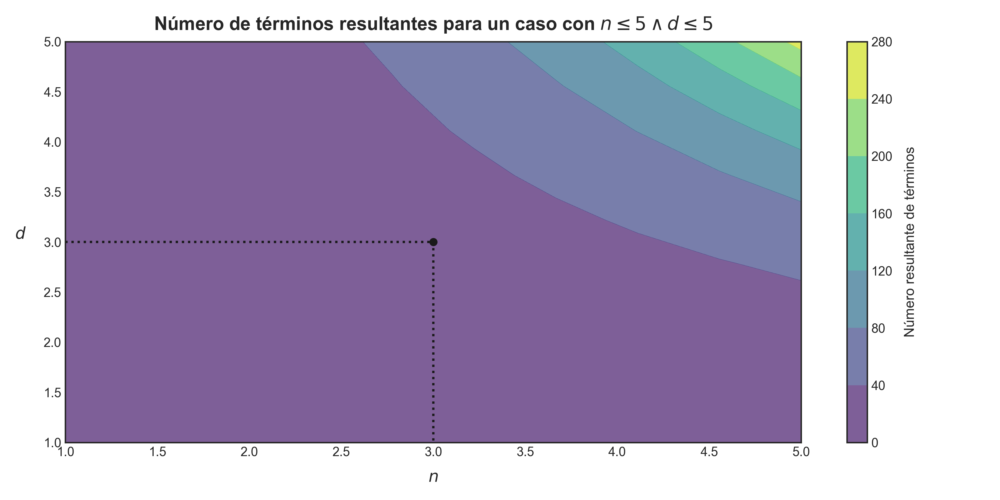

In [70]:
# Construimos nuestro gráfico.
fig, ax = plt.subplots(figsize=(12, 6))
p1 = ax.contourf(N, D, Z, cmap="viridis", alpha=0.7)
p2 = ax.plot([1, 3], [3, 3], "k:", lw=2.0)
p3 = ax.plot([3, 3], [3, 1], "k:", lw=2.0)
p4 = ax.plot(3, 3, "ko")
cb = fig.colorbar(p1)
cb.set_label("Número resultante de términos", fontsize=12, labelpad=10)
ax.set_xlabel(r"$n$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$d$", fontsize=14, labelpad=20, rotation=0)
ax.set_title(
    r"Número de términos resultantes para un caso con $n\leq 5\wedge d\leq 5$",
    fontsize=16, fontweight="bold", pad=10,
)
plt.tight_layout();

**<font color='mediumorchid'>Scikit-Learn</font>** nos provee de una implementación sencilla del modelo de regresión polinomial (completo) en la forma de un transformador de variables similar a los que ya hemos usado previamente en otros ejercicios, como `StandardScaler`. En este caso, dicho transformador es `PolynomialFeatures`, y funciona de manera similar a éste último, siguiendo la filosofía de escalabilidad del API de **<font color='mediumorchid'>Scikit-Learn</font>**. Algunos parámetros de importancia para este transformador son los siguientes:

- `degree`: Permite definir el grado de la transformación polinómica a aplicar. Naturalmente, debe ser un número entero (mayor que `2`).
- `interaction_only`: Parámetro booleano que permite establecer si, como resultado de nuestra transformación polinómica, se producirán únicamente interacciones cuadríaticas (`interaction_only=True`), descartando interacciones que incluyan cuadrados, cubos, o potencias mayores de cada variable independiente. Por defecto, su valor es igual a `False`.
- `include_bias`: Parámetro booleano que permite incluir una columna asociada a un parámetro de sesgo. Dicha columna corresponde a aquella en la matriz de diseño para la cual todas las potencias de las variables independientes a transformar son de exponente cero. Por defecto, su valor es igual a `True`.

Ejemplificaremos el uso de este transformador haciendo uso de una matriz muy sencilla, de dimensión `(5, 3)`, que emulará `5` observaciones de `3` variables independientes, las que serán enteras y estarán uniformemente distribuidas entre `1` y `9`:

In [71]:
# Creamos nuestro conjunto de datos.
X = rng.integers(low=1, high=10, size=(5, 3))

In [72]:
# Mostramos en pantalla estos datos.
X

array([[8, 4, 4],
       [7, 6, 5],
       [4, 9, 1],
       [1, 5, 1],
       [4, 6, 4]])

Al aplicar una transformación polinómica completa de grado `2` (o cuadrática), obtendremos el siguiente resultado:

In [73]:
from sklearn.preprocessing import PolynomialFeatures

In [74]:
# Instanciamos nuestro transformador.
poly = PolynomialFeatures(degree=2)

In [75]:
# Aplicamos una transformación polinómica completa de grado 2.
Z = poly.fit_transform(X)
Z

array([[ 1.,  8.,  4.,  4., 64., 32., 32., 16., 16., 16.],
       [ 1.,  7.,  6.,  5., 49., 42., 35., 36., 30., 25.],
       [ 1.,  4.,  9.,  1., 16., 36.,  4., 81.,  9.,  1.],
       [ 1.,  1.,  5.,  1.,  1.,  5.,  1., 25.,  5.,  1.],
       [ 1.,  4.,  6.,  4., 16., 24., 16., 36., 24., 16.]])

Y eso es todo. Notemos que, a partir de la matriz $\mathbf{X} =\left\{ x_{ij} \right\} \in \mathbb{R}^{5\times 3}$ hemos creado una nueva matriz transformada $\mathbf{Z} =\left\{ z_{ij} \right\} \in \mathbb{R}^{5\times \frac{\left( 3+2 \right) !}{3!2!}}$, tal que

$$\mathbf{Z} =\left( \begin{matrix}1&x_{11}&x_{12}&x_{13}&x_{11}^{2}&x_{11}x_{12}&x_{11}x_{13}&x_{12}^{2}&x_{12}x_{13}&x_{13}^{2}\\ 1&x_{21}&x_{22}&x_{23}&x_{21}^{2}&x_{21}x_{22}&x_{21}x_{23}&x_{22}^{2}&x_{22}x_{23}&x_{23}^{2}\\ 1&x_{31}&x_{32}&x_{33}&x_{31}^{2}&x_{31}x_{32}&x_{31}x_{33}&x_{32}^{2}&x_{32}x_{33}&x_{33}^{2}\\ 1&x_{41}&x_{42}&x_{43}&x_{41}^{2}&x_{41}x_{42}&x_{41}x_{43}&x_{42}^{2}&x_{42}x_{43}&x_{43}^{2}\\ 1&x_{51}&x_{52}&x_{53}&x_{51}^{2}&x_{51}x_{52}&x_{51}x_{53}&x_{52}^{2}&x_{52}x_{53}&x_{53}^{2}\end{matrix} \right) \in \mathbb{R}^{5\times 10}$$
<p style="text-align: right;">$(4.38)$</p>

El orden que se muestra de los elementos en cada fila de $\mathbf{Z}$, de izquierda a derecha, es el que está seteado en **<font color='mediumorchid'>Scikit-Learn</font>** a la hora de retornar un dataset transformado por medio de `PolynomialFeatures`. Notemos además que el resultado de la transformación es una nueva matriz de datos de entrada con un total de $10$ variables independientes, porque $\frac{\left( 3+2 \right) !}{3!2!}=10$.

Para ejemplificar de manera práctica el cómo implementar un modelo de regresión polinomial, volvamos a crear un conjunto de datos, pero esta vez con muchas más instancias. En concreto, generaremos un conjunto en $\mathbb{R}^{2}$ con datos uniformemente distribuidos, representados por pares del tipo $(x, y)$, donde $y=\frac{1}{2} x^{2}+x+2+\mathrm{ruido\  Gaussiano}$. De esta manera, tenemos:

In [76]:
# Construimos nuestro conjunto de datos.
X = 6 * rng.random(size=(1000, 1)) - 3
y = (1/2) * X**2 + X + 2 + rng.normal(loc=0, scale=1, size=(1000, 1))

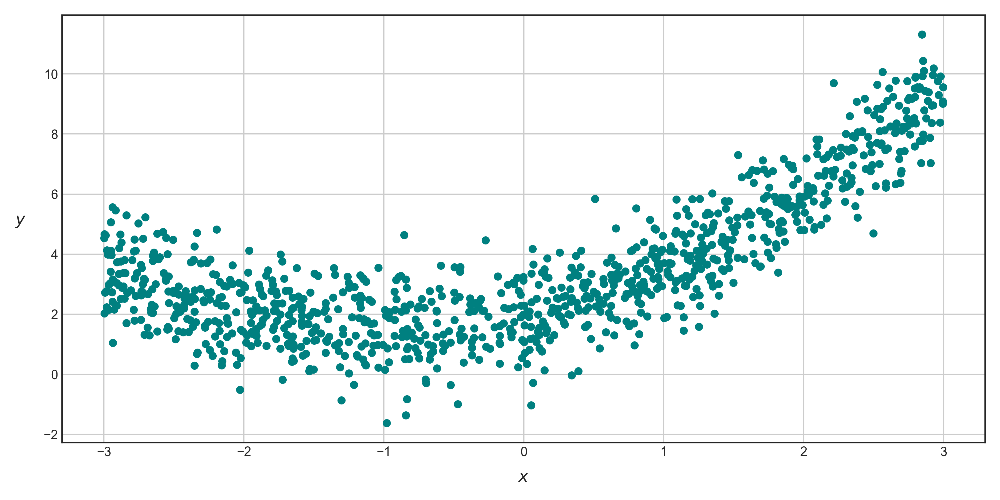

In [77]:
# Visualizamos nuestro conjunto de datos.
fig, ax = plt.subplots(figsize=(12, 6))
ax.scatter(X, y, color="teal", marker="o")
ax.set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$y$", fontsize=14, labelpad=20, rotation=0)
ax.grid(True)
plt.tight_layout();

Podemos construir de manera sencilla un modelo de regresión polinomial para este conjunto de datos haciendo uso del transformador `PolynomialFeatures`. Para ello, generaremos una sencilla pipeline que se encargará de, al mismo tiempo, transformar nuestras variables de entrada y ajustar el modelo correspondiente por medio del método de mínimos cuadrados (es decir, usando la clase `LinearRegression`):

In [78]:
from sklearn.pipeline import Pipeline

In [79]:
# Creamos un modelo de regresión polinomial de grado 2.
model = Pipeline(
    steps=[
        ("poly_transform", PolynomialFeatures(degree=2)), 
        ("estimator", LinearRegression()),
    ],
)

In [80]:
# Entrenamos nuestro modelo.
model.fit(X, y)

Pipeline(steps=[('poly_transform', PolynomialFeatures()),
                ('estimator', LinearRegression())])

In [81]:
# Y generamos predicciones.
x_range = np.linspace(start=X.min(), stop=X.max(), num=100).reshape(-1, 1)
y_pred = model.predict(x_range)

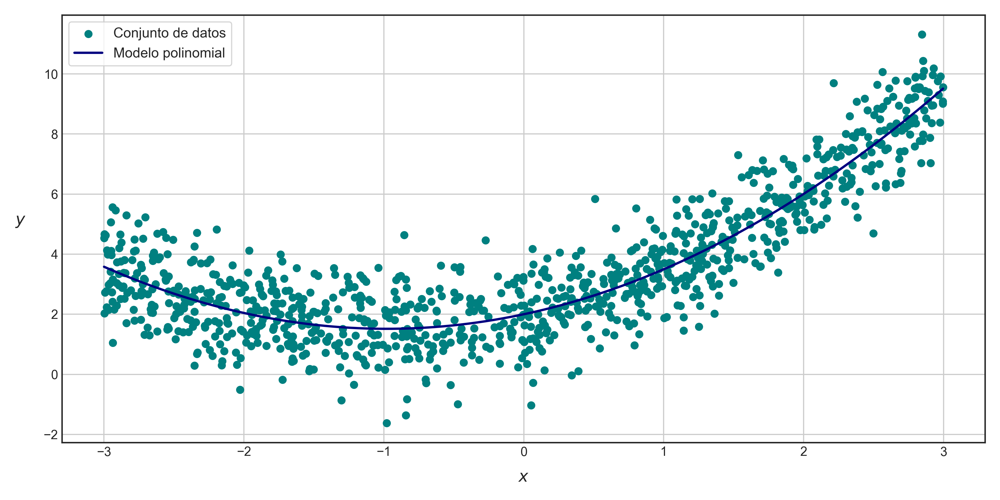

In [82]:
# Visualizamos los resultados.
fig, ax = plt.subplots(figsize=(12, 6))
ax.scatter(X, y, color="teal", marker="o", label="Conjunto de datos")
ax.plot(x_range, y_pred, color="navy", lw=2.0, label="Modelo polinomial")
ax.set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$y$", fontsize=14, labelpad=20, rotation=0)
ax.grid(True)
ax.legend(loc="best", fontsize=12, frameon=True)
plt.tight_layout();

Podemos observar que nuestro modelo tiene una calidad razonable en los datos de entrenamiento, aunque claro... aún no hemos indagado en ningún tipo de métrica de desempeño para modelos de regresión, pero paciencia, ya entraremos de lleno en eso un poco más adelante. ◼︎